In [1]:
import sys 
sys.path.append("../")
import pydicom
import pydicom_seg
import SimpleITK as sitk
import matplotlib.pyplot as plt
import numpy as np
import misc, dataloader
import glob, os
import cv2
import scipy.ndimage
from skimage import measure, morphology
from mpl_toolkits.mplot3d.art3d import Poly3DCollection

In [2]:
def lung_segment(image, pix_spc):
    mask_air = np.zeros_like(image)
    mask_air[image > -300] = 1.
    y_min, y_max, h_max = image.shape[0], 0, 0
    idx = 0
    n_sl = mask_air.shape[0] # No. slice
    col, row = mask_air.shape[:2]
    mask = np.zeros((mask_air.shape[0], mask_air.shape[2]), np.uint8)
    for slice in range(image.shape[1]//2 -3, image.shape[1]//2 + 3):
        _, img_bw = cv2.threshold((mask_air[:, slice,:]*255.).astype(np.uint8), 150, 255, cv2.THRESH_BINARY_INV)
        _, contours, hierarchy = cv2.findContours(img_bw, cv2.RETR_LIST, cv2.CHAIN_APPROX_SIMPLE)
#         plt.imshow(img_bw, cmap="gray")
#         plt.show()       
        for i in range(len(contours)):
            area = cv2.contourArea(contours[i])
            if area < 4000/pix_spc**2 or  area > 35000/pix_spc**2:
                continue
            (x,y,w,h) = cv2.boundingRect(contours[i])
            if 4000/pix_spc**2 <= area <= 35000/pix_spc**2 and x+y != 0 and x+w < row \
                    and 70/pix_spc<w<h<=370/pix_spc and (h>160/pix_spc) and (w/h > 0.4) \
                    and (n_sl*0.6<y +h//2 < n_sl*0.8): # or (h < n_sl and col<=1.5*row)): 
                if y < y_min:
                    y_min = y
                if y+h > y_max:
                    y_max = y+h
                if h > h_max:
                    h_max = h
                    idx = slice
                mask = cv2.drawContours(mask, [contours[i]], -1, (255), -1)
#                 print(area,x,y,w,h)
#                 plt.imshow(mask, cmap="gray")
#                 plt.show()
#             else:
#                 print(area,x,y,w,h)
#                 print()
#                 mask = cv2.drawContours(mask, [contours[i]], -1, (255), -1)
#                 plt.imshow(mask, cmap="gray")
#                 plt.show()
                

    return idx, y_min, y_max, mask

def check_path_dicom(pathCTdicom_, pathSegdicom_, dirName, fileList):
    if (len(fileList) > 1) :
        pathCTdicom_ = dirName
    elif (len(fileList) == 1) and "Segmentation" in dirName:
        pathSegdicom_ = dirName
    
    return pathCTdicom_, pathSegdicom_


0.0 1.0
0.0 0.5970031
LC00009
62 128 196 68
0


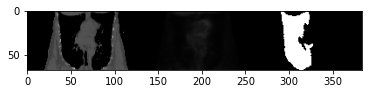


0.0 1.0
0.0 1.0
LC00012
66 237 294 57
0


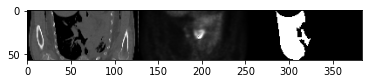


0.0 1.0
0.0 1.0
LC00013
64 128 203 75
0


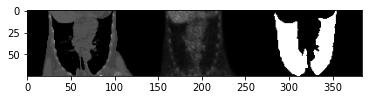


0.0 1.0
0.0 0.69450974
LC00021
64 130 206 76
0


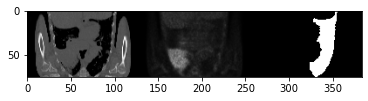


0.0 1.0
0.0 1.0
LC00022
61 132 189 57
0


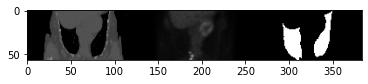


0.0 1.0
0.0 0.73082674
LC00025
61 123 184 61
0


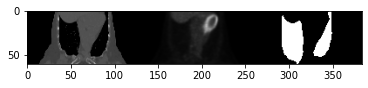


0.0 1.0
0.0 1.0
LC00026
62 214 286 72
0


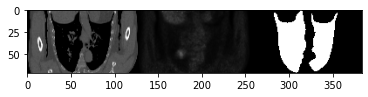


0.0 1.0
0.0 1.0
LC00027
63 206 294 88
0


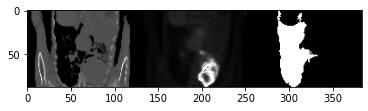


0.0 1.0
0.0 1.0
LC00032
64 221 274 53
0


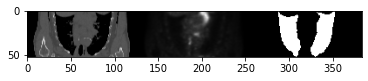


0 287 0
LC00034-Can not detect lung
0.0 1.0
0.0 1.0
LC00035
66 200 249 49
1


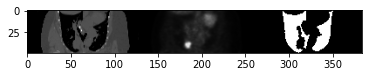


0.0 1.0
0.0 1.0
LC00039
61 195 259 64
1


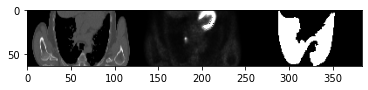


0.0 1.0
0.0 1.0
LC00040
64 194 278 84
1


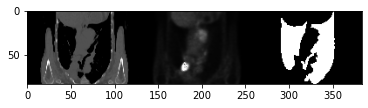


0.0 1.0
0.0 1.0
LC00041
62 222 271 49
1


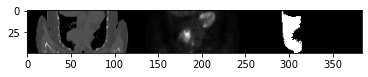


0.0 1.0
0.0 1.0
LC00042
66 216 274 58
1


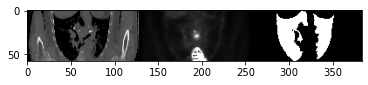


0.0 1.0
0.0 0.52015746
LC00043
66 228 285 57
1


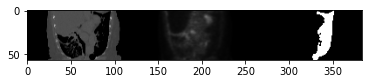


0.0 1.0
0.0 0.9778741
LC00045
61 236 293 57
1


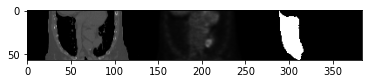


0.0 1.0
0.0 1.0
LC00046
65 133 197 64
1


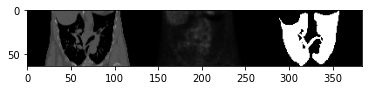


0.0 1.0
0.0 0.9578234
LC00047
66 214 270 56
1


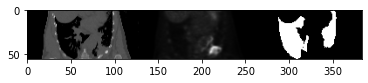


0.0 1.0
0.0 1.0
LC00051
61 230 294 64
1


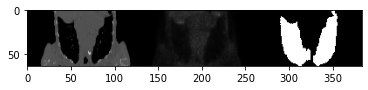


0.0 1.0
0.0 1.0
LC00053
64 206 268 62
1


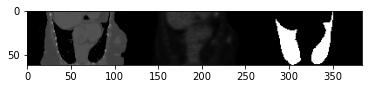


0.0 1.0
0.0 0.7108371
LC00057
62 207 275 68
1


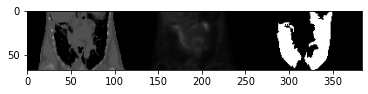


0.0 1.0
0.0 1.0
LC00061
63 212 282 70
1


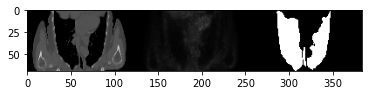


0.0 1.0
0.0 0.77660453
LC00062
64 149 204 55
1


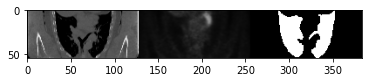


0.0 1.0
0.0 1.0
LC00064
61 161 225 64
1


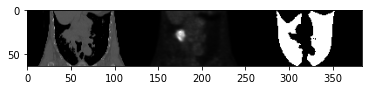


0.0 1.0
0.0 1.0
LC00067
65 230 297 67
1


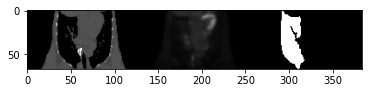


0.0 1.0
0.0 0.41425824
LC00072
65 103 173 70
1


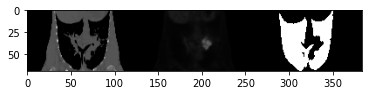


0.0 1.0
0.0 0.52327037
LC00079
62 223 281 58
1


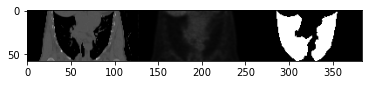


0.0 1.0
0.0 1.0
LC00095
61 180 254 74
1


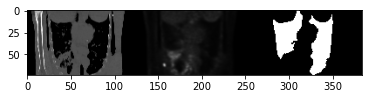


0.0 1.0
0.0 1.0
LC00118
63 211 278 67
1


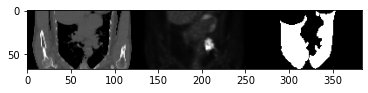


0.0 1.0
0.0 0.9900815
LC00124
65 227 291 64
1


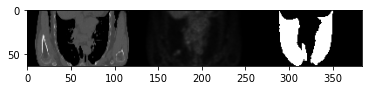


0.0 1.0
0.0 1.0
LC00135
61 229 290 61
1


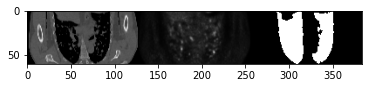


0.0 1.0
0.0 1.0
LC00140
66 149 207 58
1


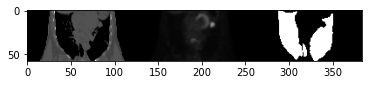


0.0 1.0
0.0 0.81426436
LC00146
65 207 271 64
1


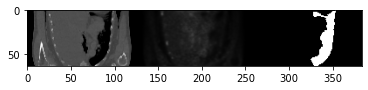


0.0 1.0
0.0 0.8496048
LC00152
63 218 275 57
1


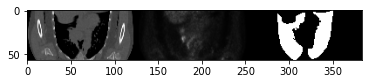


0.0 1.0
0.0 1.0
LC00168
66 228 279 51
1


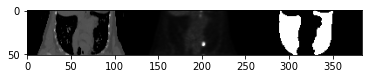


0.0 1.0
0.0 1.0
LC00181
63 176 240 64
1


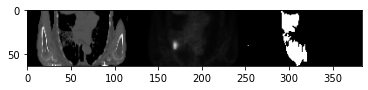


0.0 1.0
0.0 1.0
LC00184
65 143 200 57
1


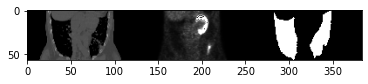


0.0 1.0
0.0 1.0
LC00186
66 216 282 66
1


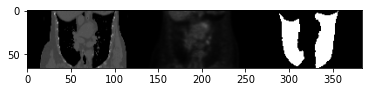


0.0 1.0
0.0 1.0
LC00189
66 205 272 67
1


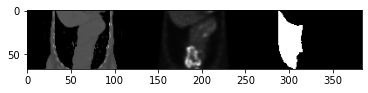


0.0 1.0
0.0 0.8113956
LC00200
66 146 204 58
1


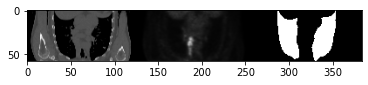


0.0 0.92
0.0 1.0
LC00202
61 155 211 56
1


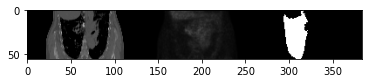


0.0 1.0
0.0 0.7418134
LC00203
65 222 276 54
1


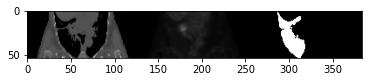


0.0 1.0
0.0 1.0
LC00212
64 197 263 66
1


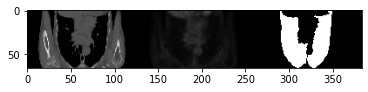


0.0 1.0
0.0 1.0
LC00215
66 131 203 72
1


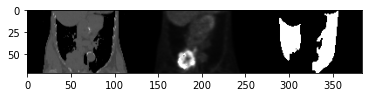


0.0 1.0
0.0 1.0
LC00239
66 193 264 71
1


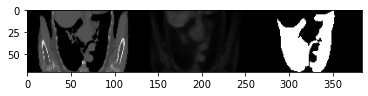


0.0 1.0
0.0 1.0
LC00241
65 228 283 55
1


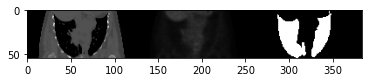


0.0 1.0
0.0 1.0
LC00247
64 163 221 58
1


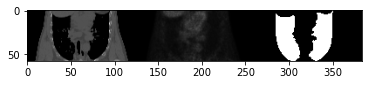


0.0 1.0
0.0 1.0
LC00253
63 215 276 61
1


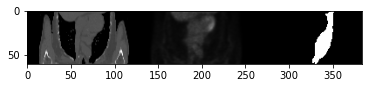


0.0 1.0
0.0 1.0
LC00256
62 225 301 76
1


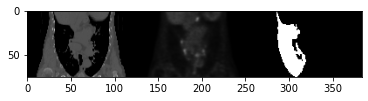


0.0 1.0
0.0 1.0
LC00270
66 212 281 69
1


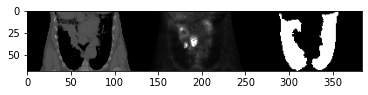


0.0 1.0
0.0 1.0
LC00276
66 216 276 60
1


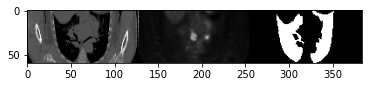


0.0 1.0
0.0 1.0
LC00280
61 212 290 78
1


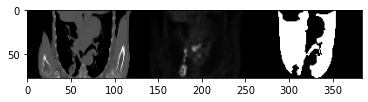


0.0 1.0
0.0 1.0
LC00294
65 197 252 55
1


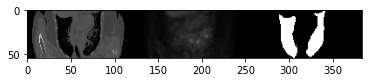


0.0 1.0
0.0 0.67265844
LC00295
65 128 203 75
1


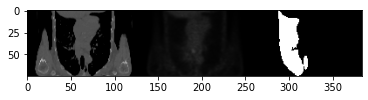


0.0 1.0
0.0 0.52949613
LC00313
63 191 268 77
1


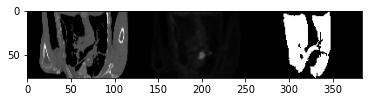


0.0 1.0
0.0 0.4477676
LC00315
66 139 215 76
1


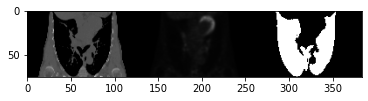


0.0 1.0
0.0 0.9793084
LC00327
66 153 203 50
1


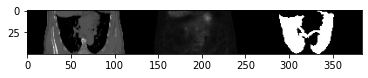


0.0 1.0
0.0 1.0
LC00328
65 212 279 67
1


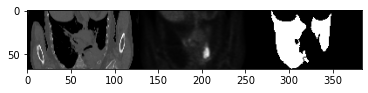


0.0 1.0
0.0 0.97158724
LC00329
62 202 266 64
1


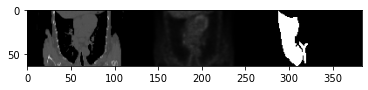


0.0 1.0
0.0 1.0
LC00334
66 118 196 78
1


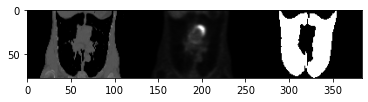


0.0 1.0
0.0 1.0
LC00335
66 130 180 50
1


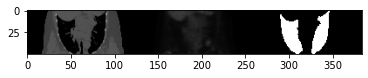


0.0 1.0
0.0 0.7632374
LC00337
64 136 196 60
1


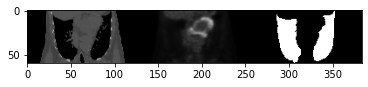


0.0 1.0
0.0 1.0
LC00340
66 186 246 60
1


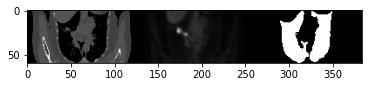


0.0 0.996
0.0 1.0
LC00341
66 149 190 41
1


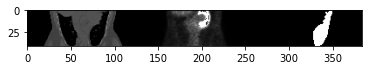


0.0 1.0
0.0 1.0
LC00344
65 205 273 68
1


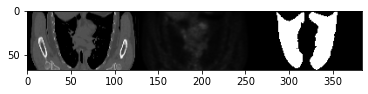


0.0 1.0
0.0 0.73693043
LC00346
61 222 288 66
1


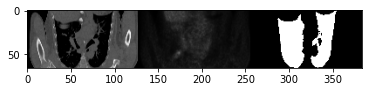


0.0 1.0
0.0 0.85097814
LC00347
66 140 187 47
1


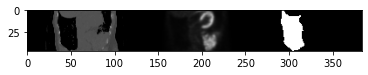


0.0 1.0
0.0 1.0
LC00353
61 215 278 63
1


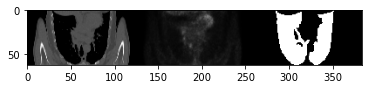


0.0 1.0
0.0 1.0
LC00357
66 193 260 67
1


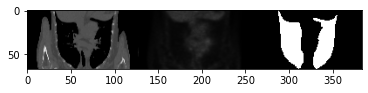


0.0 1.0
0.0 1.0
LC00359
61 186 266 80
1


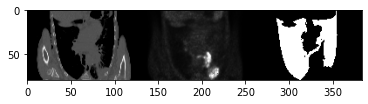


0.0 1.0
0.0 0.9394513
LC00360
62 220 296 76
1


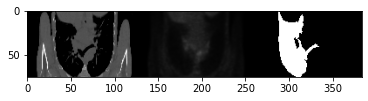


0.0 1.0
0.0 1.0
LC00375
66 194 242 48
1


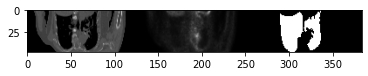


0.0 1.0
0.0 0.7036958
LC00376
65 119 175 56
1


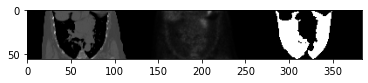


0.0 1.0
0.0 0.81456953
LC00379
62 206 275 69
1


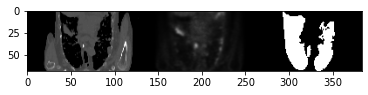


0.0 0.99
0.0 1.0
LC00383
65 144 194 50
1


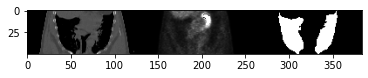


0.0 1.0
0.0 1.0
LC00385
61 218 283 65
1


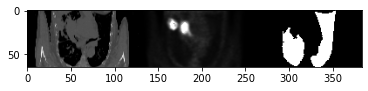


0.0 1.0
0.0 1.0
LC00386
65 223 293 70
1


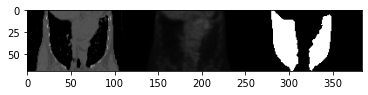


0.0 1.0
0.0 1.0
LC00431
62 214 276 62
1


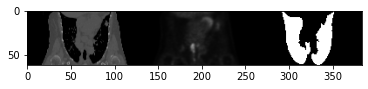


0.0 1.0
0.0 0.7788934
LC00432
64 215 274 59
1


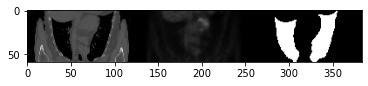


0.0 1.0
0.0 1.0
LC00436
65 223 282 59
1


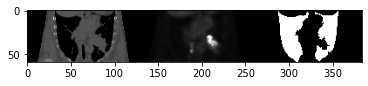


0.0 1.0
0.0 0.68941313
LC00441
62 232 298 66
1


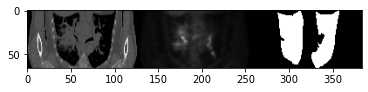


0.0 1.0
0.0 1.0
LC00443
66 139 206 67
1


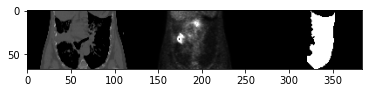


0.0 1.0
0.0 1.0
LC00449
66 243 300 57
1


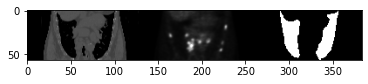


0.0 1.0
0.0 0.9469283
LC00466
64 203 270 67
1


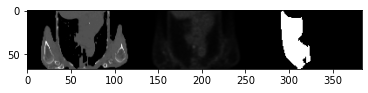


0.0 1.0
0.0 0.8909879
LC00470
66 123 197 74
1


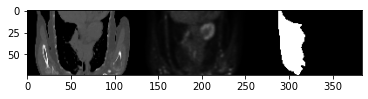


0.0 1.0
0.0 1.0
LC00471
62 229 286 57
1


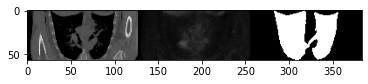


0.0 1.0
0.0 1.0
LC00474
65 220 278 58
1


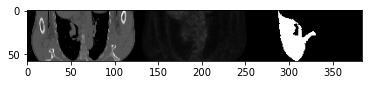


0.0 1.0
0.0 1.0
LC00484
66 216 265 49
1


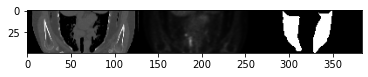


0.0 1.0
0.0 0.94964445
LC00514
65 182 238 56
1


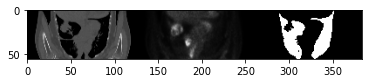


0.0 1.0
0.0 1.0
LC00518
62 138 202 64
1


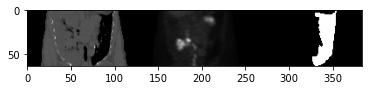


0.0 1.0
0.0 1.0
LC00524
64 211 291 80
1


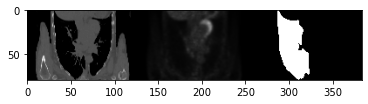


0.0 1.0
0.0 1.0
LC00527
63 201 273 72
1


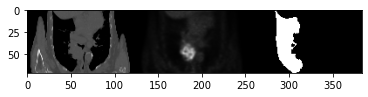


0.0 1.0
0.0 1.0
LC00528
61 197 264 67
1


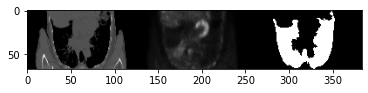


0.0 1.0
0.0 1.0
LC00530
65 212 273 61
1


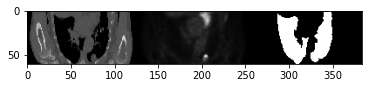


0.0 1.0
0.0 1.0
LC00532
61 137 194 57
1


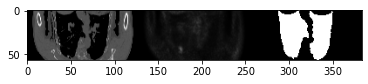


0.0 1.0
0.0 1.0
LC00543
65 197 263 66
1


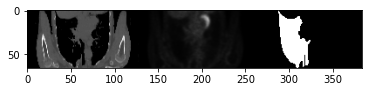


0.0 1.0
0.0 1.0
LC00547
61 211 275 64
1


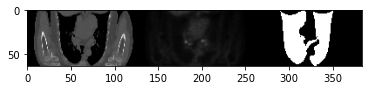


0.0 1.0
0.0 1.0
LC00549
65 123 199 76
1


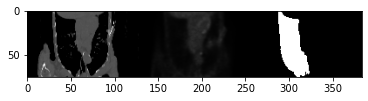


0.0 1.0
0.0 1.0
LC00550
66 201 272 71
1


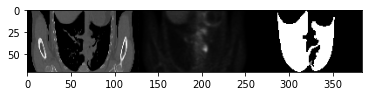


0.0 1.0
0.0 1.0
LC00552
62 213 281 68
1


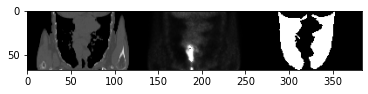


0.0 1.0
0.0 1.0
LC00558
66 224 284 60
1


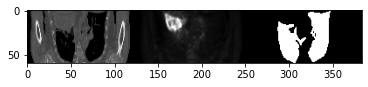


0.0 1.0
0.0 1.0
LC00560
66 207 269 62
1


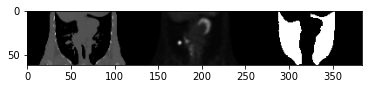


0.0 1.0
0.0 1.0
LC00568
66 214 263 49
1


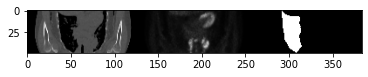


0.0 1.0
0.0 0.79546493
LC00581
63 155 218 63
1


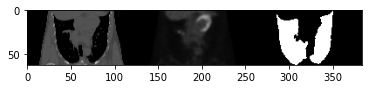


0.0 1.0
0.0 1.0
LC00588
65 179 247 68
1


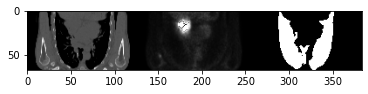


0.0 1.0
0.0 0.6877651
LC00591
65 217 272 55
1


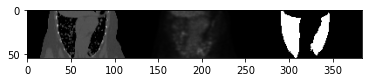


0.0 1.0
0.0 0.81786555
LC00599
66 227 289 62
1


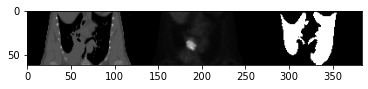


0.0 1.0
0.0 1.0
LC00602
65 125 198 73
1


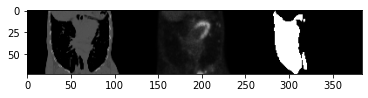


0.0 1.0
0.0 1.0
LC00604
65 211 273 62
1


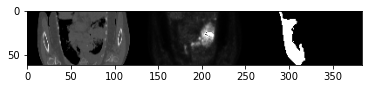


0.0 1.0
0.0 1.0
LC00606
62 182 269 87
1


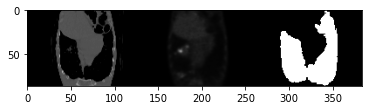


0.0 1.0
0.0 1.0
LC00609
66 223 266 43
1


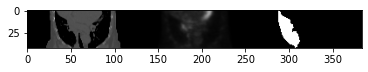


0.0 1.0
0.0 1.0
LC00613
66 223 278 55
1


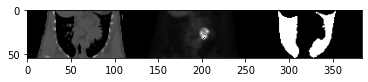


0 322 0
LC00619-Can not detect lung
0.0 1.0
0.0 0.4118778
LC00623
65 213 282 69
2


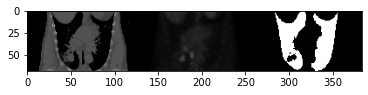


0.0 1.0
0.0 1.0
LC00625
64 248 304 56
2


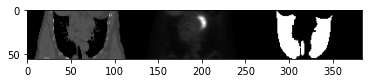


0.0 1.0
0.0 1.0
LC00626
66 222 278 56
2


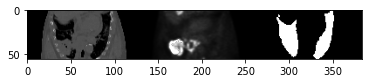


0.0 1.0
0.0 1.0
LC00628
66 214 268 54
2


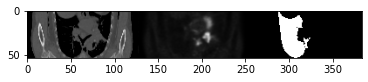


0.0 1.0
0.0 1.0
LC00629
63 215 282 67
2


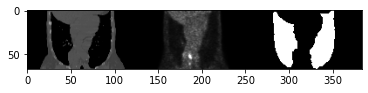


0.0 1.0
0.0 1.0
LC00635
66 219 270 51
2


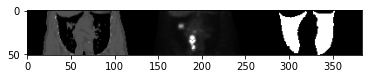


0.0 1.0
0.0 1.0
LC00638
66 142 191 49
2


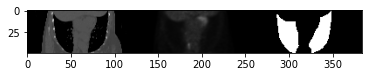


0.0 1.0
0.0 0.69472337
LC00642
66 225 293 68
2


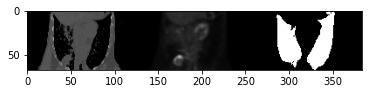


0.0 1.0
0.0 1.0
LC00644
64 156 223 67
2


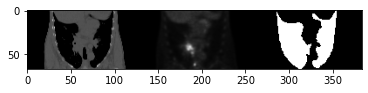


0.0 1.0
0.0 0.70888394
LC00649
66 141 204 63
2


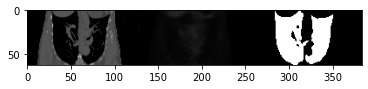


0.0 1.0
0.0 1.0
LC00660
66 128 203 75
2


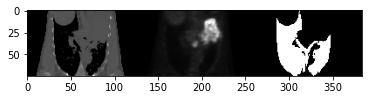


0.0 1.0
0.0 0.8027589
LC00670
63 199 271 72
2


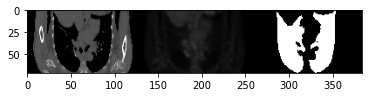


0.0 1.0
0.0 1.0
LC00712
65 234 291 57
2


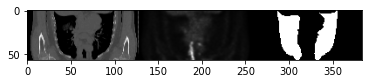


0.0 1.0
0.0 1.0
LC00732
64 116 200 84
2


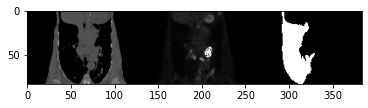


0.0 1.0
0.0 0.9799799
LC00734
61 155 211 56
2


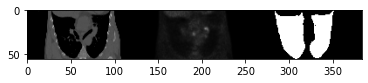


0.0 1.0
0.0 1.0
LC00736
66 222 290 68
2


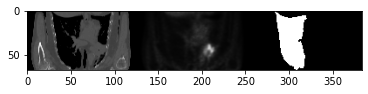


0.0 1.0
0.0 1.0
LC00745
61 208 274 66
2


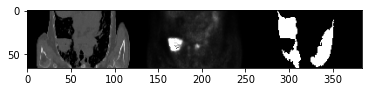


0 322 0
LC00776-Can not detect lung
0.0 1.0
0.0 1.0
LC00783
64 226 282 56
3


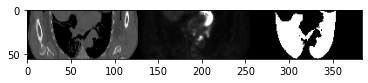


0.0 1.0
0.0 1.0
LC00784
66 237 299 62
3


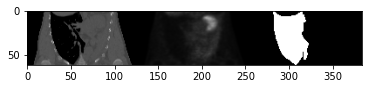


0.0 1.0
0.0 1.0
LC00787
64 217 278 61
3


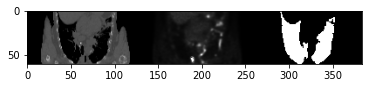


0.0 1.0
0.0 1.0
LC00791
61 230 281 51
3


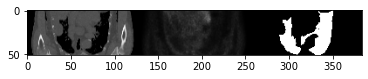


0.0 1.0
0.0 1.0
LC00794
66 237 302 65
3


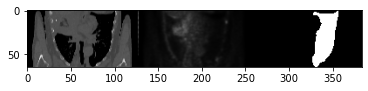


0.0 1.0
0.0 0.75096893
LC00798
66 224 278 54
3


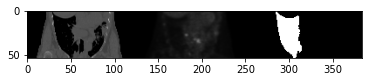


0 337 0
LC00802-Can not detect lung
0.0 1.0
0.0 1.0
LC00808
63 198 272 74
4


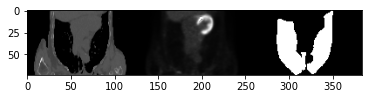


0.0 1.0
0.0 0.8539384
LC00811
66 223 292 69
4


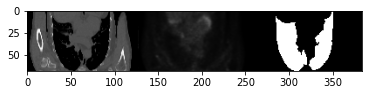


0.0 1.0
0.0 1.0
LC00812
66 194 247 53
4


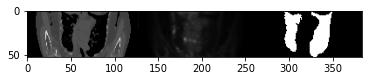


0.0 1.0
0.0 0.941496
LC00814
65 138 198 60
4


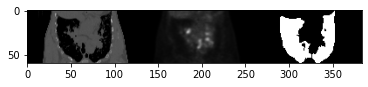


0.0 0.968
0.0 0.82326734
LC00816
66 137 191 54
4


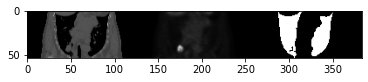


0.0 1.0
0.0 1.0
LC00817
65 221 282 61
4


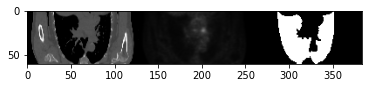


0.0 1.0
0.0 1.0
LC00824
65 138 200 62
4


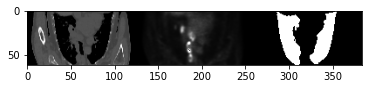


0.0 1.0
0.0 0.33494064
LC00830
66 224 294 70
4


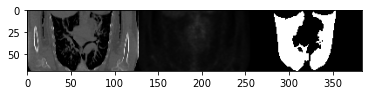


0.0 1.0
0.0 1.0
LC00833
63 196 266 70
4


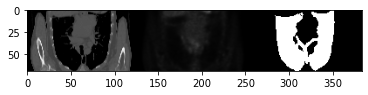


0.0 1.0
0.0 0.6929228
LC00836
64 136 200 64
4


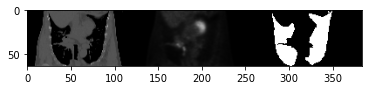


0.0 1.0
0.0 1.0
LC00840
66 138 206 68
4


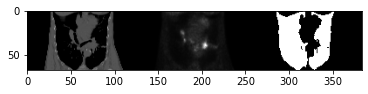


0.0 1.0
0.0 1.0
LC00844
66 106 173 67
4


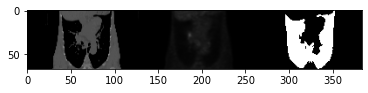


0.0 1.0
0.0 0.9392987
LC00845
66 200 243 43
4


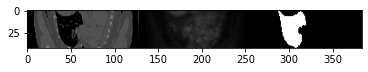


0.0 1.0
0.0 0.95870847
LC00849
66 217 271 54
4


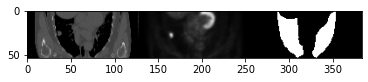


0.0 1.0
0.0 1.0
LC00855
61 135 200 65
4


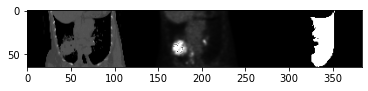


0.0 1.0
0.0 1.0
LC00856
63 180 263 83
4


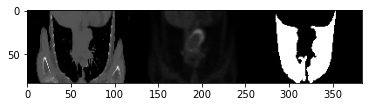


0.0 1.0
0.0 1.0
LC00857
61 203 279 76
4


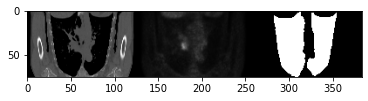


0.0 1.0
0.0 1.0
LC00864
62 131 193 62
4


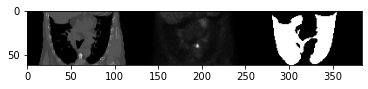


0 300 0
LC00872-Can not detect lung
0.0 1.0
0.0 1.0
LC00876
65 207 263 56
5


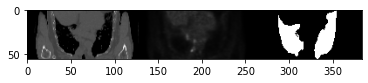


0.0 1.0
0.0 1.0
LC00878
65 230 294 64
5


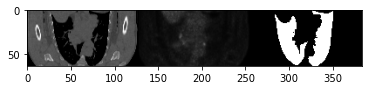


0.0 1.0
0.0 1.0
LC00883
66 231 293 62
5


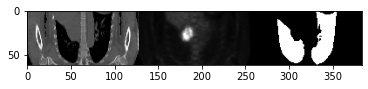


0.0 1.0
0.0 0.68086797
LC00884
66 237 295 58
5


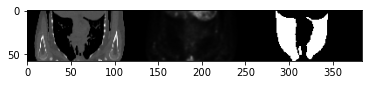


0.0 1.0
0.0 1.0
LC00888
66 214 280 66
5


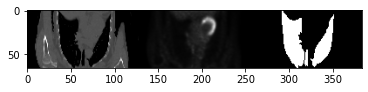


0.0 0.959
0.0 1.0
LC00891
64 245 312 67
5


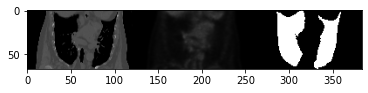


0.0 1.0
0.0 0.5612659
LC00893
66 223 277 54
5


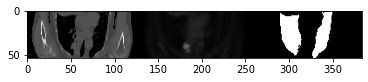


0.0 1.0
0.0 0.8235115
LC00894
66 201 267 66
5


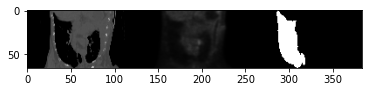


0.0 1.0
0.0 0.9279763
LC00895
66 213 281 68
5


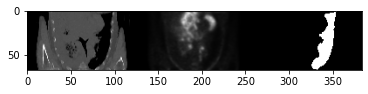


0.0 1.0
0.0 0.70159
LC00897
66 139 196 57
5


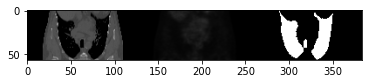


0.0 0.99
0.0 1.0
LC00898
66 187 255 68
5


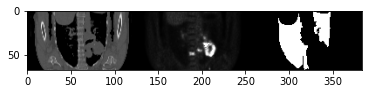


0.0 0.994
0.0 1.0
LC00903
66 210 276 66
5


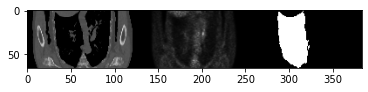


0.0 1.0
0.0 0.48963895
LC00904
63 90 136 46
5


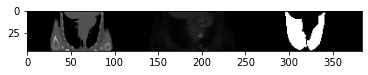


0.0 1.0
0.0 0.821894
LC00914
65 170 242 72
5


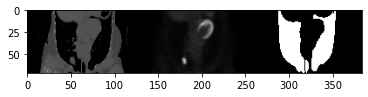


0.0 1.0
0.0 1.0
LC00919
66 200 259 59
5


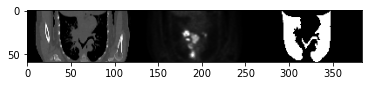


0.0 1.0
0.0 1.0
LC00920
65 193 261 68
5


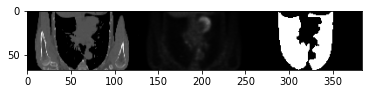


0.0 1.0
0.0 1.0
LC00923
65 156 221 65
5


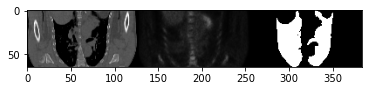


0.0 1.0
0.0 0.49977112
LC00925
63 132 184 52
5


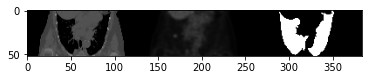


0.0 1.0
0.0 0.95306253
LC00928
64 226 293 67
5


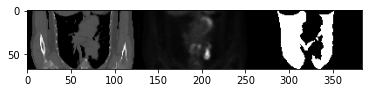


0.0 1.0
0.0 1.0
LC00930
61 214 278 64
5


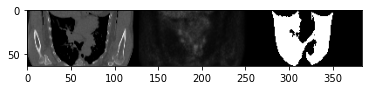


0.0 0.996
0.0 1.0
LC00931
66 187 232 45
5


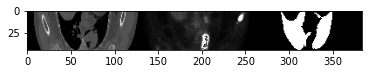


0.0 1.0
0.0 1.0
LC00934
63 199 269 70
5


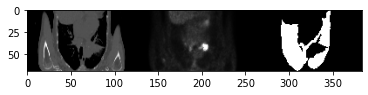


0.0 1.0
0.0 1.0
LC00938
65 231 299 68
5


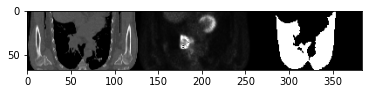


0.0 1.0
0.0 1.0
LC00940
66 137 189 52
5


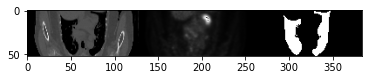


0.0 1.0
0.0 0.5084994
LC00945
66 141 201 60
5


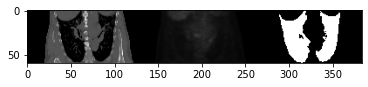


0.0 0.943
0.0 1.0
LC00959
62 224 296 72
5


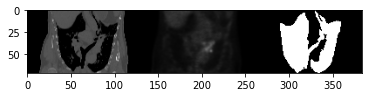


0.0 1.0
0.0 1.0
LC00966
61 201 274 73
5


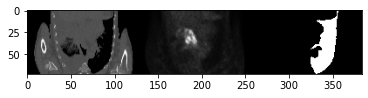


0.0 1.0
0.0 1.0
LC00980
63 219 295 76
5


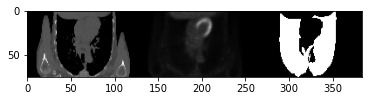


0.0 1.0
0.0 1.0
LC00986
65 191 253 62
5


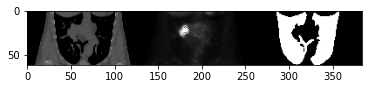


0.0 1.0
0.0 1.0
LC01000
61 209 282 73
5


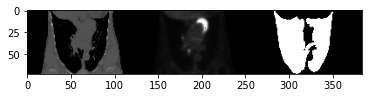


0.0 1.0
0.0 1.0
LC01001
66 198 265 67
5


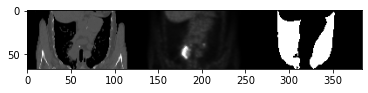


0.0 1.0
0.0 0.9968871
LC01006
65 204 272 68
5


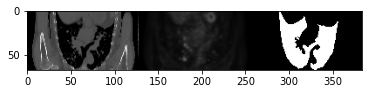


0.0 1.0
0.0 0.96209604
LC01013
64 217 280 63
5


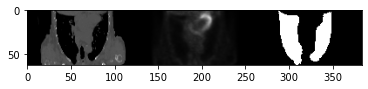


0.0 1.0
0.0 1.0
LC01018
66 218 275 57
5


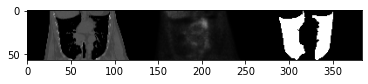


0.0 1.0
0.0 1.0
LC01025
66 198 250 52
5


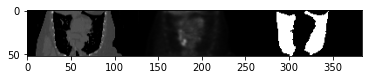


0.0 1.0
0.0 1.0
LC01042
61 218 288 70
5


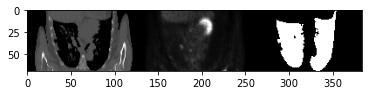


0.0 1.0
0.0 1.0
LC01049
66 160 225 65
5


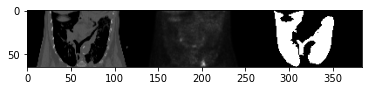


0.0 0.9885
0.0 1.0
LC01055
64 224 285 61
5


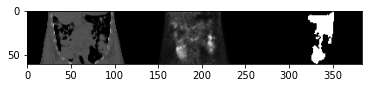


0.0 1.0
0.0 1.0
LC01058
61 193 263 70
5


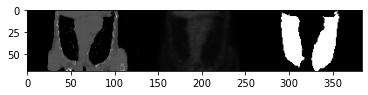


0.0 1.0
0.0 1.0
LC01060
65 221 281 60
5


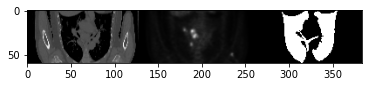


0.0 1.0
0.0 1.0
LC01063
62 236 288 52
5


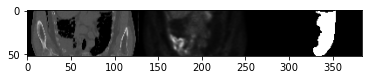


0.0 1.0
0.0 1.0
LC01073
66 143 198 55
5


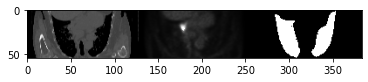


0.0 1.0
0.0 1.0
LC01074
66 143 198 55
5


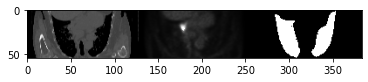


0.0 1.0
0.0 1.0
LC01075
64 223 286 63
5


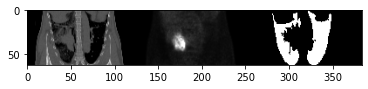


0.0 1.0
0.0 0.40998566
LC01076
66 209 265 56
5


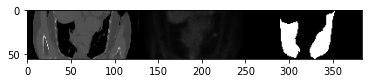


0.0 1.0
0.0 0.7434309
LC01077
66 173 233 60
5


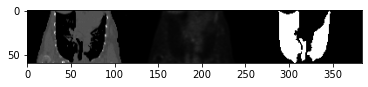


0.0 1.0
0.0 1.0
LC01083
66 214 274 60
5


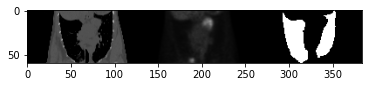


0.0 1.0
0.0 1.0
LC01087
65 185 236 51
5


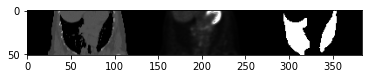


0.0 1.0
0.0 0.67940307
LC01090
63 153 210 57
5


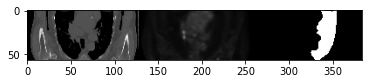


0.0 1.0
0.0 0.9190344
LC01095
66 212 272 60
5


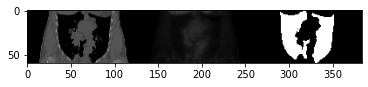


0.0 1.0
0.0 1.0
LC01099
63 209 271 62
5


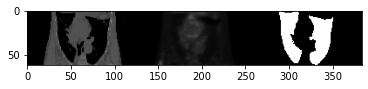


0.0 1.0
0.0 0.35493025
LC01108
66 214 280 66
5


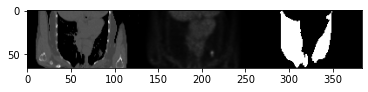


0.0 1.0
0.0 1.0
LC01109
61 196 271 75
5


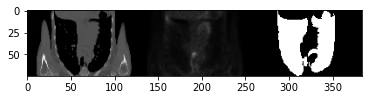


0.0 1.0
0.0 0.37238684
LC01111
66 221 270 49
5


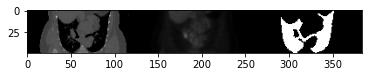


0 306 0
LC01115-Can not detect lung
0 306 0
LC01119-Can not detect lung
0.0 1.0
0.0 1.0
LC01124
66 225 287 62
7


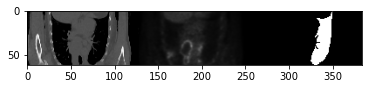


0.0 1.0
0.0 0.8980682
LC01128
63 180 237 57
7


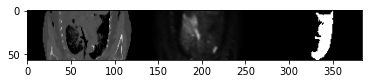


0.0 1.0
0.0 0.9112522
LC01132
61 132 191 59
7


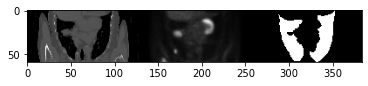


0.0 1.0
0.0 0.9576403
LC01133
63 215 276 61
7


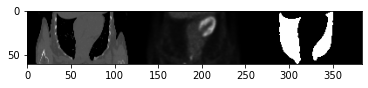


0.0 1.0
0.0 0.82085633
LC01145
66 179 236 57
7


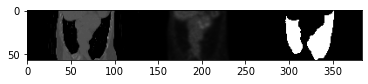


0.0 1.0
0.0 0.9382305
LC01147
66 199 261 62
7


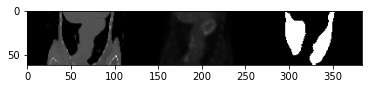


0.0 1.0
0.0 1.0
LC01150
65 236 293 57
7


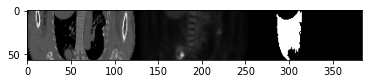


0.0 1.0
0.0 1.0
LC01151
61 133 210 77
7


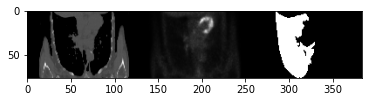


0.0 1.0
0.0 1.0
LC01170
62 214 281 67
7


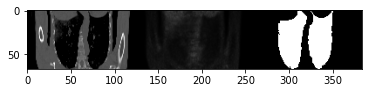


0.0 1.0
0.0 0.3399762
LC01175
65 147 196 49
7


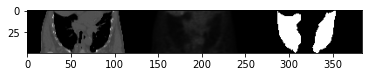


0.0 1.0
0.0 1.0
LC01177
66 197 267 70
7


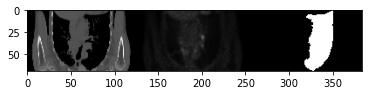


0.0 1.0
0.0 1.0
LC01181
66 139 205 66
7


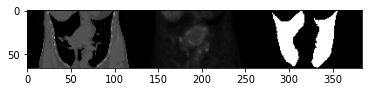


0.0 1.0
0.0 0.9350566
LC01183
64 222 274 52
7


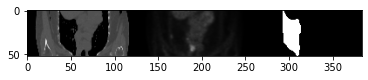


0.0 1.0
0.0 0.7786798
LC01194
65 192 254 62
7


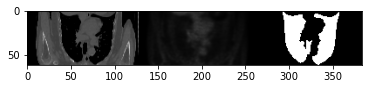


0.0 1.0
0.0 0.9356975
LC01195
61 211 276 65
7


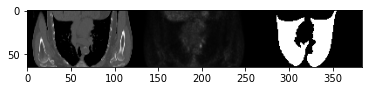


0.0 1.0
0.0 0.92080444
LC01200
61 204 272 68
7


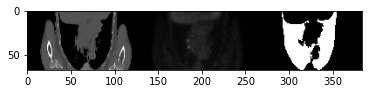


0.0 1.0
0.0 0.51634264
LC01201
66 213 270 57
7


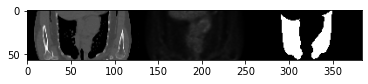


0.0 1.0
0.0 0.27213356
LC01203
66 201 277 76
7


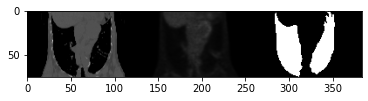


0.0 1.0
0.0 0.86754966
LC01205
64 233 295 62
7


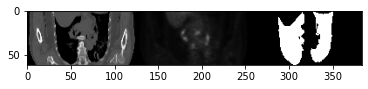


0.0 1.0
0.0 0.5775628
LC01212
63 138 210 72
7


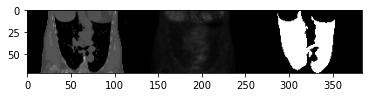


0.0 1.0
0.0 0.7477645
LC01224
65 226 276 50
7


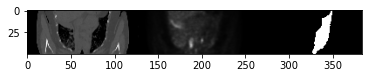


0.0 1.0
0.0 1.0
LC01225
64 208 270 62
7


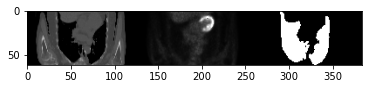


0.0 1.0
0.0 1.0
LC01230
61 134 207 73
7


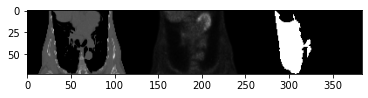


0.0 1.0
0.0 1.0
LC01245
66 231 300 69
7


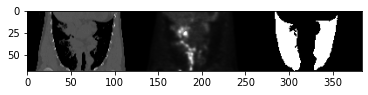


0.0 1.0
0.0 1.0
LC01247
65 156 225 69
7


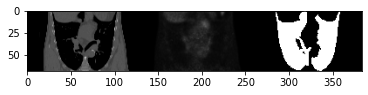


0.0 1.0
0.0 0.52919096
LC01257
66 167 234 67
7


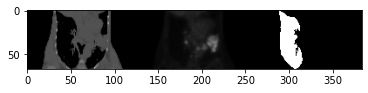


0.0 1.0
0.0 0.93905455
LC01258
66 131 193 62
7


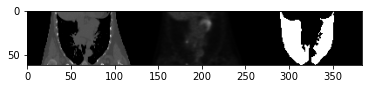


0.0 1.0
0.0 1.0
LC01262
62 178 244 66
7


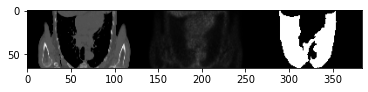


0.0 1.0
0.0 0.49458295
LC01268
63 203 271 68
7


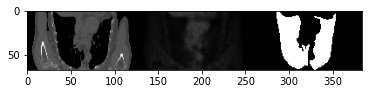


0.0 0.982
0.0 1.0
LC01281
66 218 265 47
7


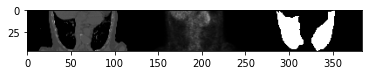


0.0 1.0
0.0 0.49687186
LC01282
65 210 268 58
7


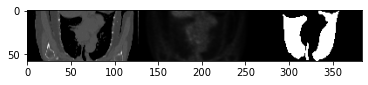


0.0 1.0
0.0 1.0
LC01284
66 236 297 61
7


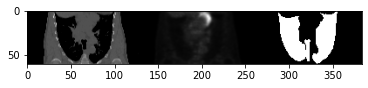


0.0 1.0
0.0 1.0
LC01287
66 146 202 56
7


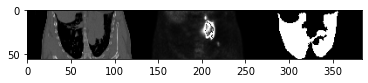


0.0 1.0
0.0 1.0
LC01288
61 250 306 56
7


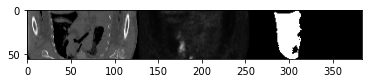


0.0 1.0
0.0 0.57454145
LC01292
64 243 301 58
7


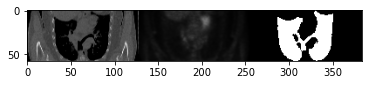


0.0 1.0
0.0 1.0
LC01296
64 146 208 62
7


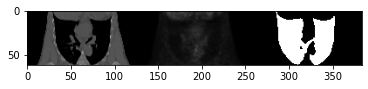


0.0 1.0
0.0 1.0
LC01298
66 223 299 76
7


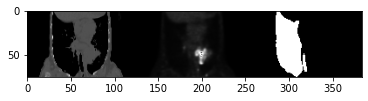


0.0 1.0
0.0 0.94589067
LC01302
66 225 302 77
7


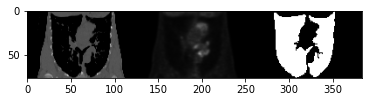


0.0 1.0
0.0 1.0
LC01307
64 134 208 74
7


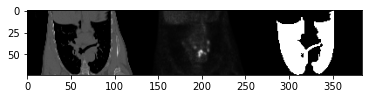


0.0 1.0
0.0 1.0
LC01308
66 202 265 63
7


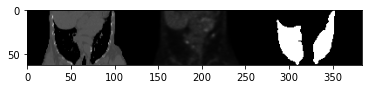


0.0 1.0
0.0 1.0
LC01320
61 215 278 63
7


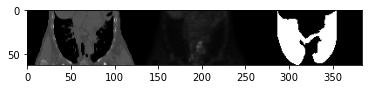


0.0 1.0
0.0 1.0
LC01321
66 219 288 69
7


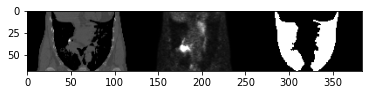


0.0 1.0
0.0 0.6873379
LC01322
66 228 281 53
7


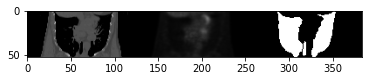


0.0 1.0
0.0 1.0
LC01331
66 235 297 62
7


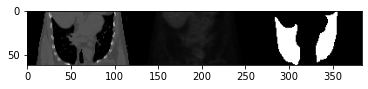


0.0 1.0
0.0 0.8761254
LC01346
65 199 260 61
7


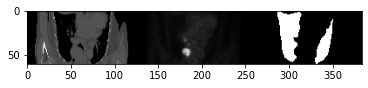


0.0 1.0
0.0 1.0
LC01348
64 160 217 57
7


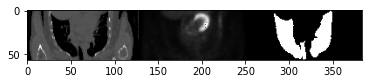


0.0 1.0
0.0 1.0
LC01349
66 222 300 78
7


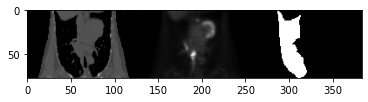


0.0 1.0
0.0 1.0
LC01352
66 136 202 66
7


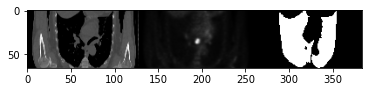


0.0 1.0
0.0 0.49009675
LC01365
61 159 224 65
7


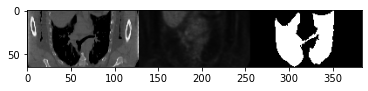


0.0 1.0
0.0 1.0
LC01368
66 213 279 66
7


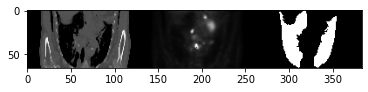


0.0 1.0
0.0 0.98904383
LC01375
66 150 231 81
7


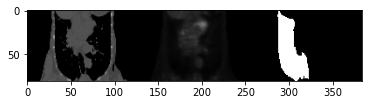


0.0 1.0
0.0 1.0
LC01376
66 136 200 64
7


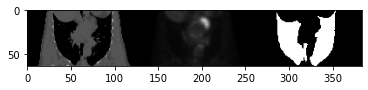


0.0 1.0
0.0 1.0
LC01378
63 131 195 64
7


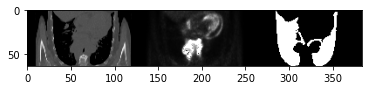


0.0 1.0
0.0 1.0
LC01381
65 215 277 62
7


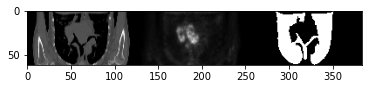


0.0 1.0
0.0 0.91683704
LC01384
65 226 290 64
7


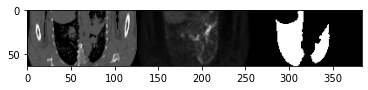


0.0 1.0
0.0 1.0
LC01385
61 210 275 65
7


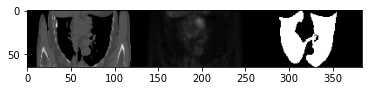


0.0 1.0
0.0 1.0
LC01386
61 210 275 65
7


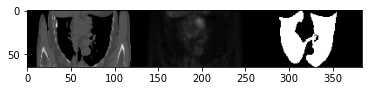


0.0 1.0
0.0 1.0
LC01387
65 221 294 73
7


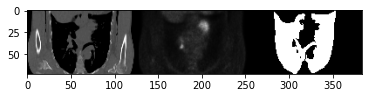


0.0 1.0
0.0 1.0
LC01389
61 142 210 68
7


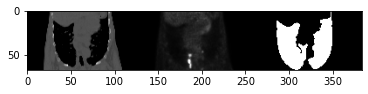


0.0 1.0
0.0 1.0
LC01390
66 187 246 59
7


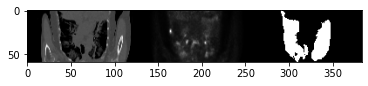


0.0 1.0
0.0 1.0
LC01395
65 226 290 64
7


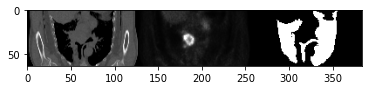


0.0 1.0
0.0 1.0
LC01399
66 205 274 69
7


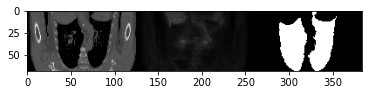


0.0 1.0
0.0 1.0
LC01400
62 193 271 78
7


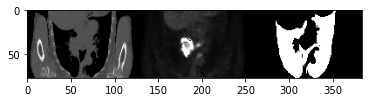


0.0 1.0
0.0 0.3872799
LC01406
66 122 177 55
7


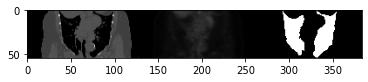


0.0 1.0
0.0 1.0
LC01407
66 194 247 53
7


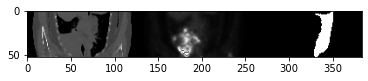


0.0 1.0
0.0 1.0
LC01410
63 194 267 73
7


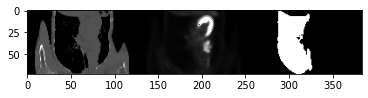


0.0 1.0
0.0 1.0
LC01413
64 226 283 57
7


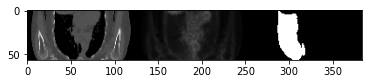


0.0 1.0
0.0 1.0
LC01418
65 214 265 51
7


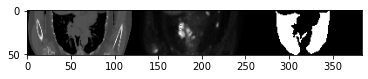


0.0 1.0
0.0 1.0
LC01420
66 152 220 68
7


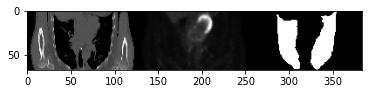


0.0 1.0
0.0 1.0
LC01423
64 229 293 64
7


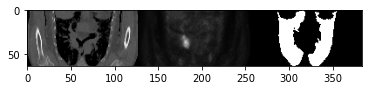


0.0 1.0
0.0 0.9803461
LC01425
65 195 266 71
7


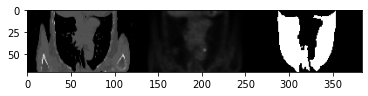


0.0 1.0
0.0 0.90517896
LC01426
64 194 268 74
7


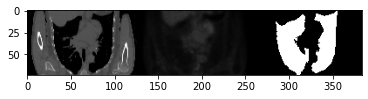


0.0 1.0
0.0 0.72188485
LC01429
66 202 257 55
7


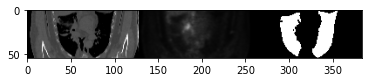


0.0 1.0
0.0 1.0
LC01430
63 231 290 59
7


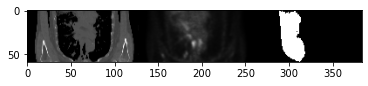


0.0 1.0
0.0 1.0
LC01431
61 220 287 67
7


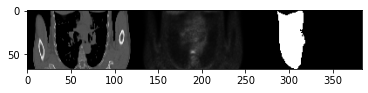


0.0 0.98
0.0 1.0
LC01433
66 122 167 45
7


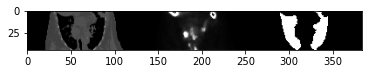


0.0 1.0
0.0 0.90194404
LC01438
66 210 290 80
7


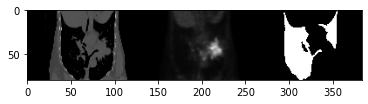


0.0 1.0
0.0 1.0
LC01439
65 181 235 54
7


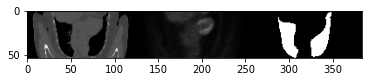


0.0 1.0
0.0 0.49705496
LC01441
66 210 283 73
7


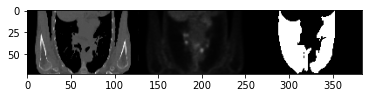


0 373 0
LC01444-Can not detect lung
0.0 1.0
0.0 1.0
LC01445
66 206 272 66
8


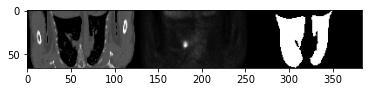


0.0 1.0
0.0 1.0
LC01446
66 228 294 66
8


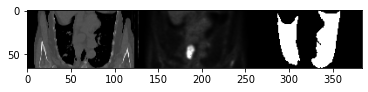


0.0 1.0
0.0 1.0
LC01447
63 202 265 63
8


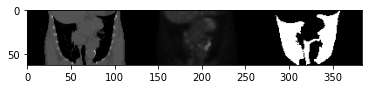


0.0 1.0
0.0 0.8172246
LC01450
66 215 275 60
8


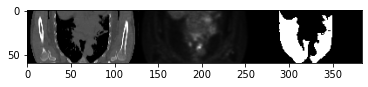


0.0 1.0
0.0 0.9954833
LC01452
65 209 269 60
8


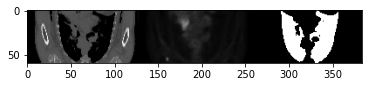


0.0 1.0
0.0 0.91186255
LC01456
66 210 274 64
8


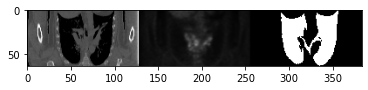


0.0 1.0
0.0 1.0
LC01459
64 225 292 67
8


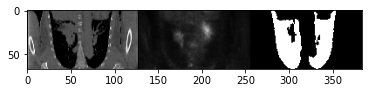


0.0 1.0
0.0 1.0
LC01460
64 222 272 50
8


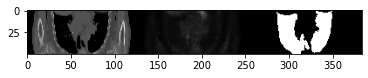


0.0 1.0
0.0 0.8422193
LC01461
63 204 270 66
8


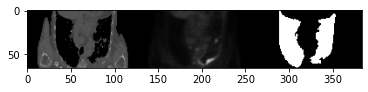


0.0 1.0
0.0 1.0
LC01462
65 200 269 69
8


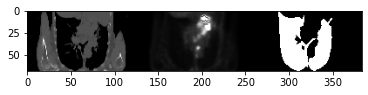


0.0 1.0
0.0 0.8780786
LC01465
63 213 284 71
8


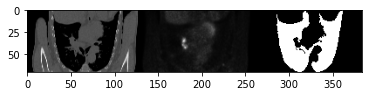


0.0 1.0
0.0 1.0
LC01466
65 226 295 69
8


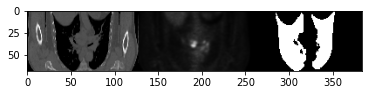


0.0 1.0
0.0 0.8725547
LC01467
66 204 249 45
8


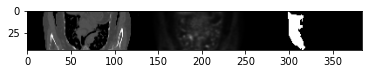


0.0 1.0
0.0 1.0
LC01468
62 206 269 63
8


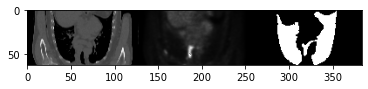


0.0 1.0
0.0 0.9106723
LC01469
66 213 262 49
8


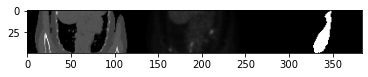


0.0 1.0
0.0 0.7289651
LC01471
62 129 196 67
8


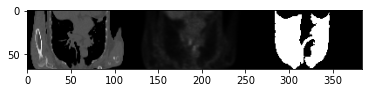


0.0 1.0
0.0 1.0
LC01472
66 169 229 60
8


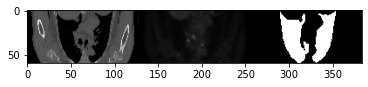


0.0 1.0
0.0 1.0
LC01476
62 182 256 74
8


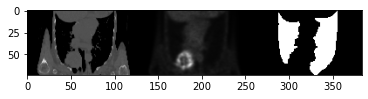


0.0 1.0
0.0 1.0
LC01477
62 166 237 71
8


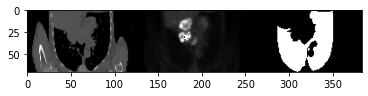


0.0 1.0
0.0 1.0
LC01478
61 133 199 66
8


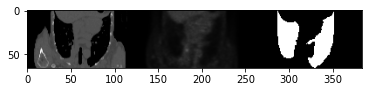


0.0 1.0
0.0 0.9456465
LC01479
61 123 188 65
8


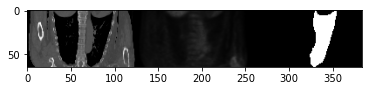


0.0 1.0
0.0 1.0
LC01480
65 192 265 73
8


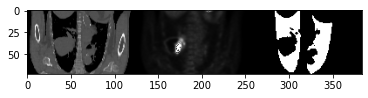


0.0 1.0
0.0 0.7980285
LC01488
65 205 275 70
8


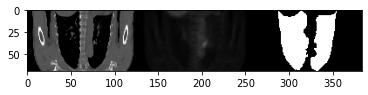


0.0 1.0
0.0 1.0
LC01489
61 216 276 60
8


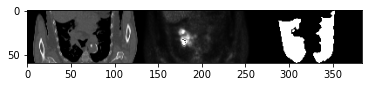


0.0 1.0
0.0 1.0
LC01505
66 195 245 50
8


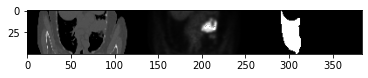


0 322 0
LC01506-Can not detect lung
0.0 1.0
0.0 1.0
LC01514
64 222 289 67
9


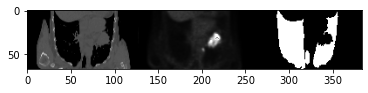


0.0 1.0
0.0 1.0
LC01516
65 217 277 60
9


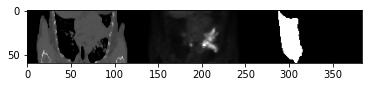


0.0 1.0
0.0 0.83965576
LC01517
65 193 273 80
9


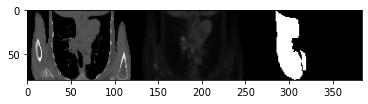


0.0 1.0
0.0 0.8076113
LC01518
63 118 183 65
9


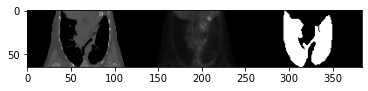


0.0 1.0
0.0 1.0
LC01526
61 203 266 63
9


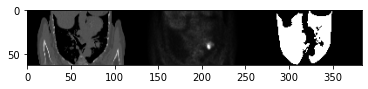


0.0 1.0
0.0 0.6897183
LC01527
61 122 189 67
9


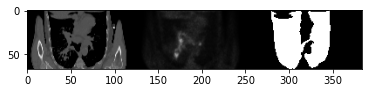


0.0 1.0
0.0 0.39762565
LC01531
64 238 294 56
9


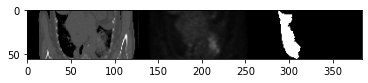


0.0 1.0
0.0 0.6497696
LC01532
65 205 272 67
9


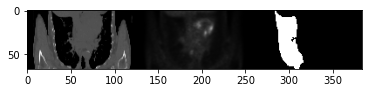


0.0 1.0
0.0 1.0
LC01539
65 140 199 59
9


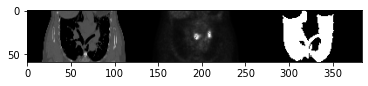


0.0 1.0
0.0 1.0
LC01561
66 209 282 73
9


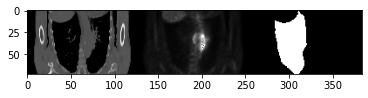


0.0 1.0
0.0 1.0
LC01570
64 235 303 68
9


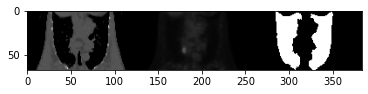


0.0 0.992
0.0 0.671926
LC01571
65 128 178 50
9


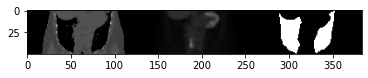


0.0 1.0
0.0 0.99575794
LC01582
66 160 224 64
9


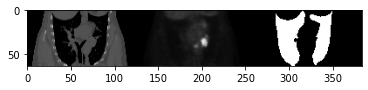


0.0 1.0
0.0 1.0
LC01586
66 224 286 62
9


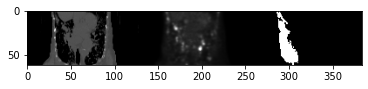


0.0 1.0
0.0 1.0
LC01587
66 237 305 68
9


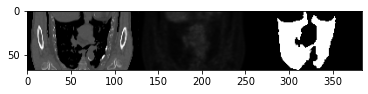


0.0 1.0
0.0 1.0
LC01592
66 139 185 46
9


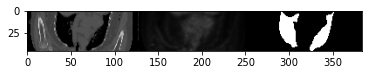


0.0 1.0
0.0 1.0
LC01597
66 204 264 60
9


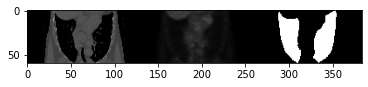


0.0 1.0
0.0 1.0
LC01599
66 134 207 73
9


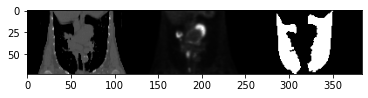


0.0 1.0
0.0 1.0
LC01601
61 212 278 66
9


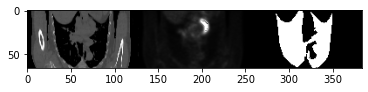


0.0 1.0
0.0 1.0
LC01604
64 196 274 78
9


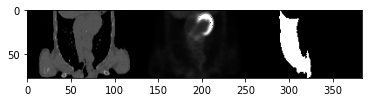


0.0 1.0
0.0 0.88698995
LC01606
62 203 270 67
9


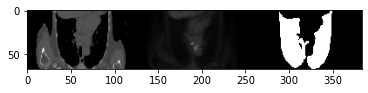


0.0 1.0
0.0 0.5645619
LC01608
66 189 249 60
9


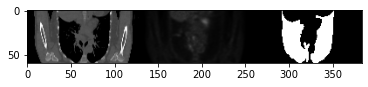


0.0 1.0
0.0 0.6582232
LC01610
65 144 200 56
9


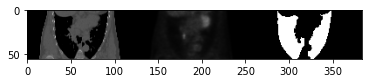


0.0 1.0
0.0 1.0
LC01614
61 203 266 63
9


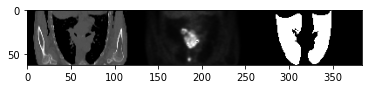


0.0 1.0
0.0 0.6481521
LC01615
66 161 222 61
9


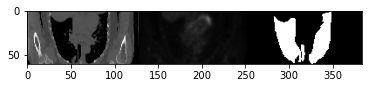


0.0 1.0
0.0 1.0
LC01636
62 139 210 71
9


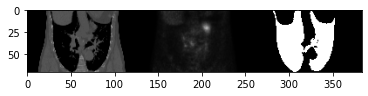


0.0 1.0
0.0 1.0
LC01637
63 191 270 79
9


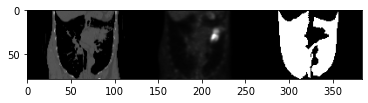


0.0 1.0
0.0 1.0
LC01644
63 123 205 82
9


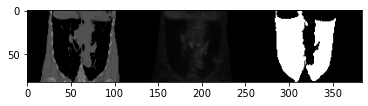


0.0 1.0
0.0 1.0
LC01677
61 147 218 71
9


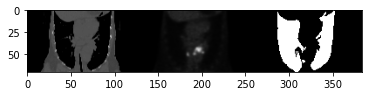


0.0 1.0
0.0 1.0
LC01679
64 215 262 47
9


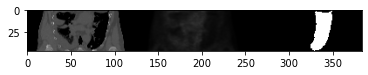


0.0 1.0
0.0 1.0
LC01681
64 210 273 63
9


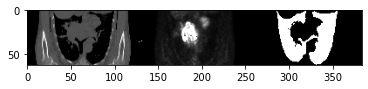


0.0 1.0
0.0 0.91927856
LC01682
62 183 245 62
9


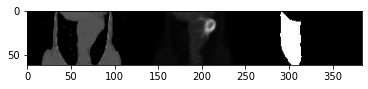


0.0 1.0
0.0 1.0
LC01683
65 149 202 53
9


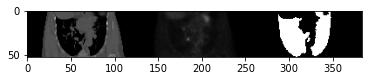


0.0 1.0
0.0 0.53276163
LC01685
66 211 279 68
9


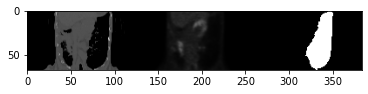


0.0 1.0
0.0 1.0
LC01686
63 213 274 61
9


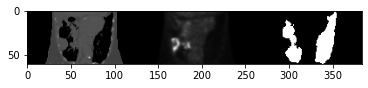


0.0 1.0
0.0 0.938963
LC01687
62 145 213 68
9


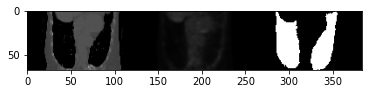


0.0 1.0
0.0 1.0
LC01690
63 232 290 58
9


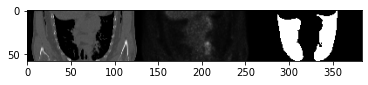


0.0 1.0
0.0 0.7655568
LC01691
63 210 280 70
9


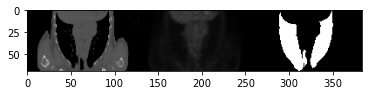


0.0 1.0
0.0 1.0
LC01693
66 146 201 55
9


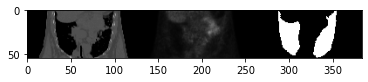


0.0 1.0
0.0 0.683401
LC01696
66 140 219 79
9


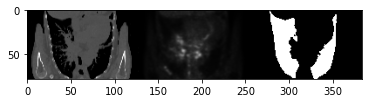


0.0 1.0
0.0 0.8863796
LC01701
66 199 262 63
9


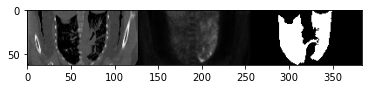


0.0 1.0
0.0 1.0
LC01708
61 227 295 68
9


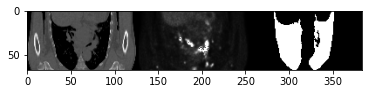


0.0 1.0
0.0 1.0
LC01716
64 169 227 58
9


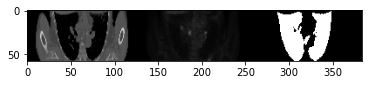


0.0 1.0
0.0 1.0
LC01719
66 230 294 64
9


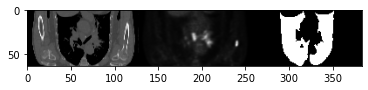


0.0 1.0
0.0 1.0
LC01723
63 210 268 58
9


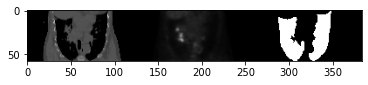


0.0 1.0
0.0 1.0
LC01724
63 210 265 55
9


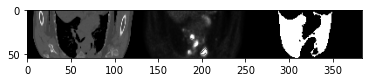


0.0 1.0
0.0 1.0
LC01726
62 202 272 70
9


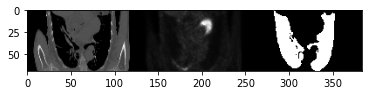


0.0 1.0
0.0 1.0
LC01729
66 211 296 85
9


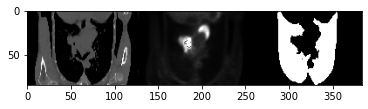


0.0 1.0
0.0 0.7824641
LC01730
66 212 261 49
9


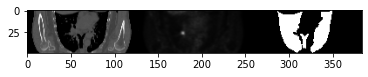


0.0 1.0
0.0 1.0
LC01732
66 199 266 67
9


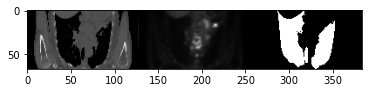


0.0 1.0
0.0 1.0
LC01734
66 214 261 47
9


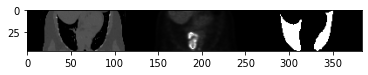


0.0 1.0
0.0 0.962859
LC01735
61 225 290 65
9


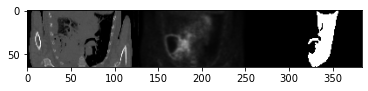


0.0 1.0
0.0 1.0
LC01736
66 150 218 68
9


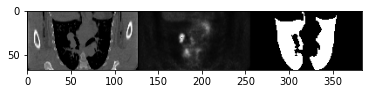


0.0 1.0
0.0 1.0
LC01738
62 189 266 77
9


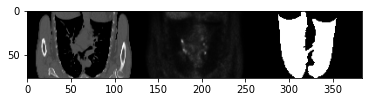


0.0 1.0
0.0 0.6329539
LC01739
66 140 205 65
9


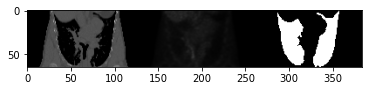


0.0 1.0
0.0 1.0
LC01754
61 210 265 55
9


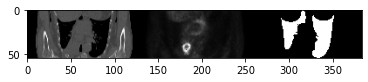


0.0 1.0
0.0 1.0
LC01755
62 205 272 67
9


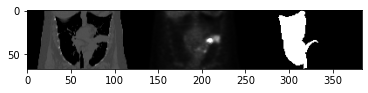


0.0 1.0
0.0 0.8986175
LC01761
66 135 180 45
9


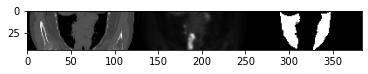


0.0 1.0
0.0 1.0
LC01769
66 221 275 54
9


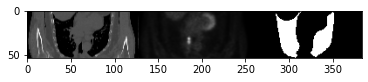


0.0 1.0
0.0 0.9591052
LC01770
66 229 287 58
9


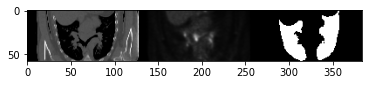


0.0 1.0
0.0 1.0
LC01771
64 206 278 72
9


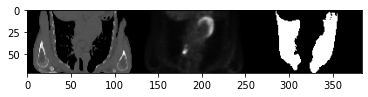


0.0 1.0
0.0 0.98803675
LC01786
64 224 293 69
9


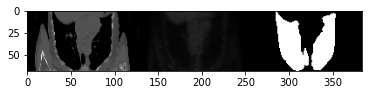


0.0 1.0
0.0 0.2684408
LC01791
66 245 302 57
9


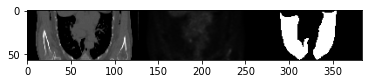


0.0 0.996
0.0 1.0
LC01792
66 149 190 41
9


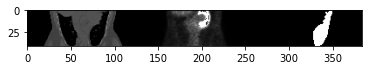


0.0 1.0
0.0 0.4016541
LC01794
66 210 262 52
9


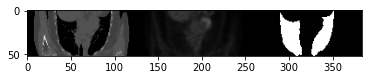


0.0 1.0
0.0 0.62483597
LC01804
66 154 216 62
9


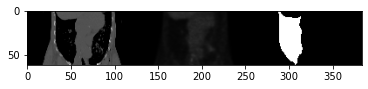


0.0 1.0
0.0 1.0
LC01819
66 137 197 60
9


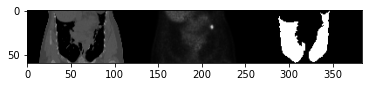


0.0 1.0
0.0 1.0
LC01821
64 204 270 66
9


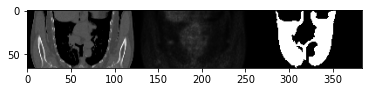


0.0 1.0
0.0 0.7929319
LC01825
66 219 261 42
9


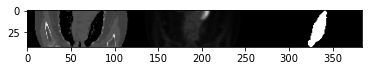


0.0 1.0
0.0 0.5067598
LC01826
65 207 266 59
9


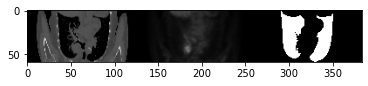


0.0 1.0
0.0 1.0
LC01829
61 200 275 75
9


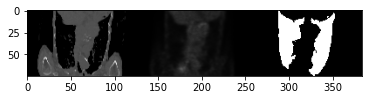


0.0 0.9815
0.0 0.5895871
LC01830
66 144 195 51
9


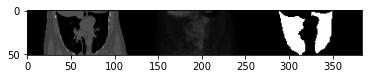


0.0 1.0
0.0 1.0
LC01839
65 217 283 66
9


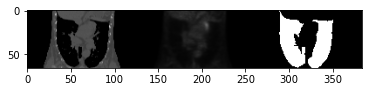


0.0 1.0
0.0 1.0
LC01840
66 126 196 70
9


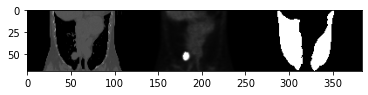


0.0 1.0
0.0 0.7780999
LC01845
62 134 192 58
9


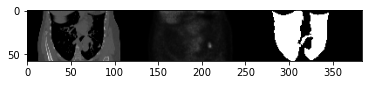


0.0 1.0
0.0 0.8424024
LC01848
65 203 269 66
9


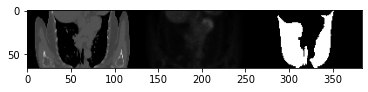


0.0 1.0
0.0 1.0
LC01858
66 130 201 71
9


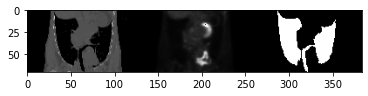


0.0 1.0
0.0 1.0
LC01865
61 200 278 78
9


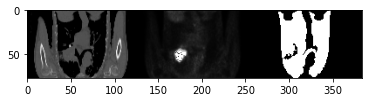


0.0 1.0
0.0 1.0
LC01866
66 193 242 49
9


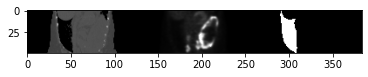


0.0 1.0
0.0 0.72869045
LC01867
63 198 276 78
9


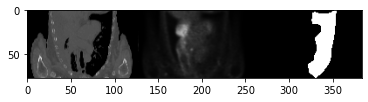


0.0 1.0
0.0 1.0
LC01870
62 216 275 59
9


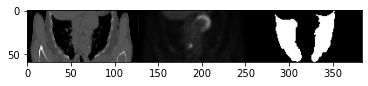


0.0 1.0
0.0 1.0
LC01874
65 182 234 52
9


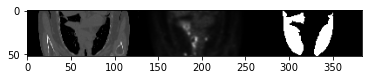


0.0 1.0
0.0 1.0
LC01879
64 123 199 76
9


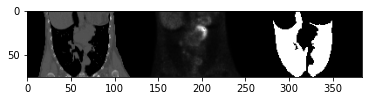


0.0 1.0
0.0 0.25040436
LC01882
62 144 207 63
9


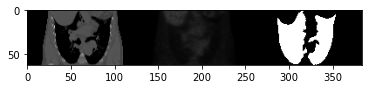


0.0 1.0
0.0 0.6530961
LC01884
66 214 272 58
9


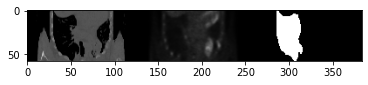


0.0 1.0
0.0 0.81789607
LC01885
66 233 279 46
9


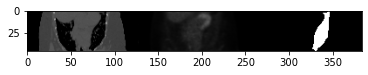


0.0 1.0
0.0 0.71825314
LC01896
61 141 204 63
9


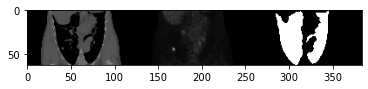


0.0 1.0
0.0 0.5749382
LC01899
63 218 278 60
9


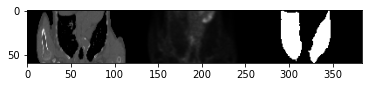


0.0 1.0
0.0 0.6063417
LC01905
61 197 247 50
9


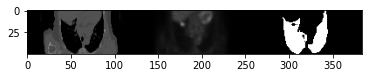


0.0 1.0
0.0 0.97466964
LC01912
64 148 206 58
9


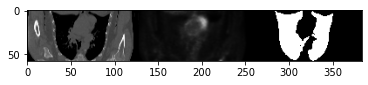


0.0 1.0
0.0 0.8873867
LC01913
64 139 195 56
9


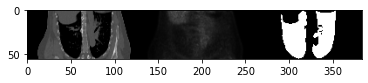


0.0 1.0
0.0 1.0
LC01915
66 135 195 60
9


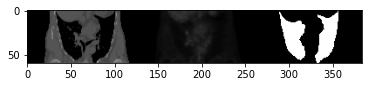


0.0 1.0
0.0 0.5393536
LC01916
66 134 189 55
9


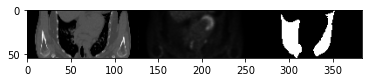


0.0 1.0
0.0 1.0
LC01917
63 205 273 68
9


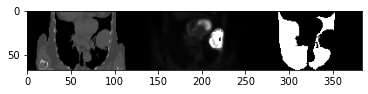


0.0 1.0
0.0 0.7792291
LC01918
61 136 202 66
9


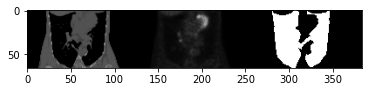


0.0 1.0
0.0 0.42252877
LC01919
66 116 171 55
9


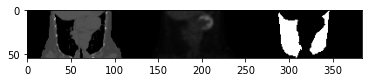


0.0 1.0
0.0 0.91183203
LC01921
65 149 205 56
9


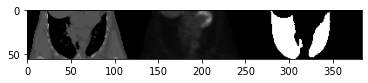


0.0 1.0
0.0 1.0
LC01922
66 135 195 60
9


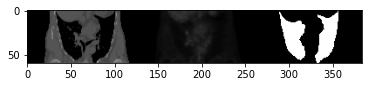


0.0 1.0
0.0 1.0
LC01934
62 131 190 59
9


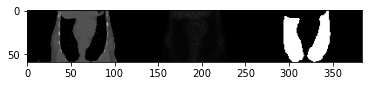


0.0 1.0
0.0 1.0
LC01942
66 216 280 64
9


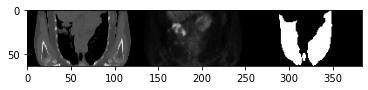


0.0 1.0
0.0 1.0
LC01945
66 137 201 64
9


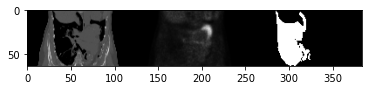


0.0 1.0
0.0 0.96365243
LC01947
65 138 208 70
9


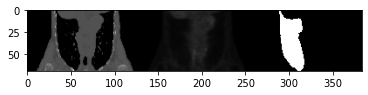


0.0 1.0
0.0 0.4951628
LC01951
63 149 206 57
9


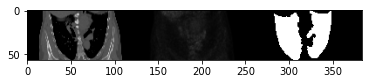


0.0 1.0
0.0 1.0
LC01952
64 201 280 79
9


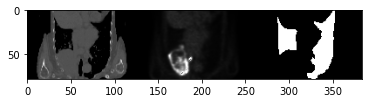


0.0 1.0
0.0 0.9939268
LC01954
64 201 272 71
9


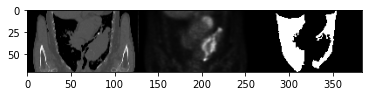


0.0 1.0
0.0 1.0
LC01955
65 230 300 70
9


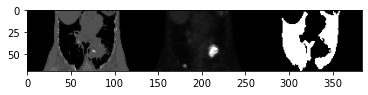


0.0 1.0
0.0 0.54826504
LC01973
66 220 268 48
9


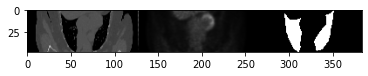


0.0 1.0
0.0 0.52739036
LC01978
66 206 260 54
9


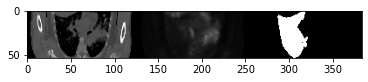


0.0 1.0
0.0 0.65541553
LC01986
63 207 265 58
9


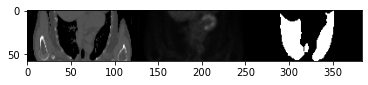


0.0 1.0
0.0 0.8306833
LC01998
65 186 247 61
9


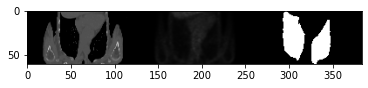


0.0 1.0
0.0 0.8822596
LC02000
64 199 264 65
9


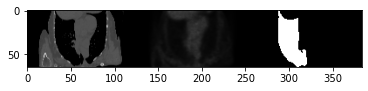


0.0 1.0
0.0 1.0
LC02005
61 149 199 50
9


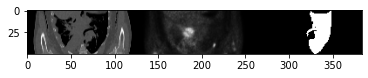


0.0 1.0
0.0 1.0
LC02012
61 222 289 67
9


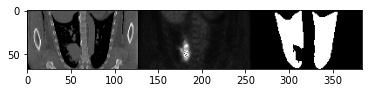


0.0 1.0
0.0 0.81063265
LC02015
63 208 266 58
9


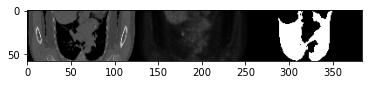


0.0 1.0
0.0 1.0
LC02016
63 213 279 66
9


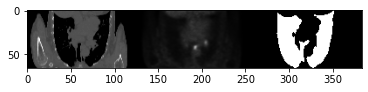


0.0 1.0
0.0 0.7487716
LC02023
66 229 294 65
9


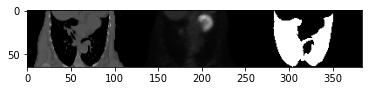


0.0 1.0
0.0 1.0
LC02026
66 210 273 63
9


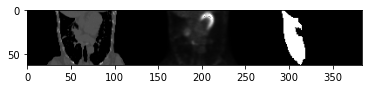


0.0 1.0
0.0 1.0
LC02032
63 121 188 67
9


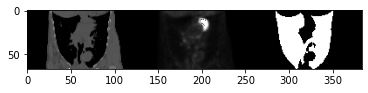


0.0 1.0
0.0 0.9881588
LC02036
65 130 192 62
9


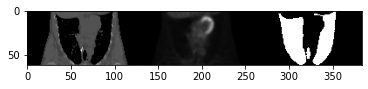


0.0 1.0
0.0 0.68117315
LC02041
61 134 199 65
9


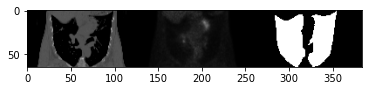


0.0 1.0
0.0 1.0
LC02043
66 131 200 69
9


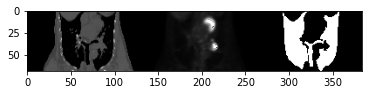


0.0 1.0
0.0 0.6920682
LC02045
66 137 196 59
9


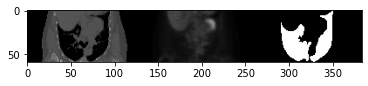


0.0 1.0
0.0 1.0
LC02047
62 201 271 70
9


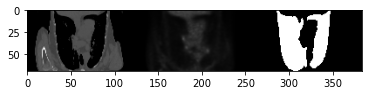


0.0 1.0
0.0 0.7291787
LC02051
66 216 274 58
9


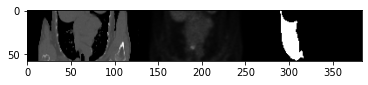


0.0 1.0
0.0 1.0
LC02056
65 186 260 74
9


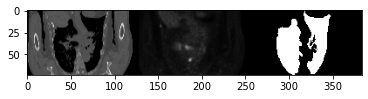


0 287 0
LC02057-Can not detect lung
0.0 1.0
0.0 1.0
LC02065
66 246 319 73
10


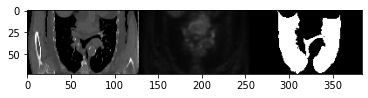


0.0 1.0
0.0 1.0
LC02067
66 215 282 67
10


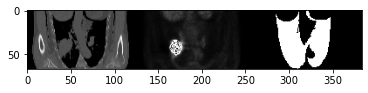


0.0 1.0
0.0 0.88448745
LC02069
65 142 206 64
10


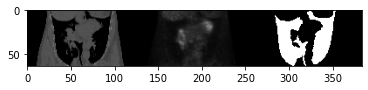


0.0 1.0
0.0 1.0
LC02071
63 219 264 45
10


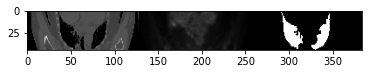


0.0 1.0
0.0 1.0
LC02073
64 226 294 68
10


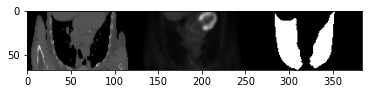


0.0 1.0
0.0 1.0
LC02077
61 195 265 70
10


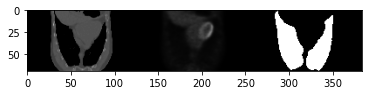


0.0 1.0
0.0 1.0
LC02092
62 191 246 55
10


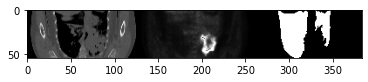


0.0 1.0
0.0 1.0
LC02095
66 156 214 58
10


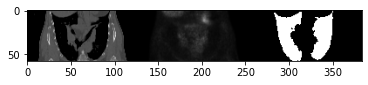


0.0 1.0
0.0 1.0
LC02097
65 218 277 59
10


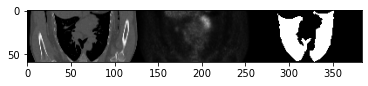


0.0 1.0
0.0 1.0
LC02099
66 187 251 64
10


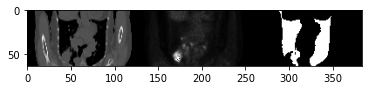


0.0 1.0
0.0 1.0
LC02102
65 152 211 59
10


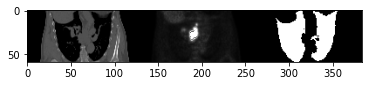


0.0 1.0
0.0 0.7343364
LC02106
65 215 280 65
10


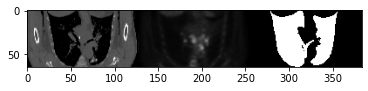


0.0 1.0
0.0 1.0
LC02112
61 210 273 63
10


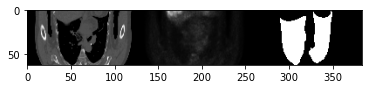


0.0 1.0
0.0 1.0
LC02115
62 205 264 59
10


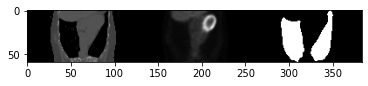


0.0 1.0
0.0 1.0
LC02119
66 232 297 65
10


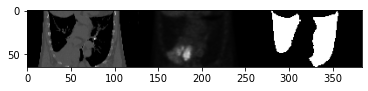


0.0 1.0
0.0 1.0
LC02122
62 233 295 62
10


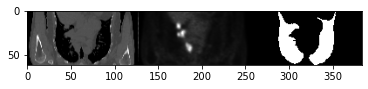


0.0 1.0
0.0 0.27149266
LC02127
65 145 196 51
10


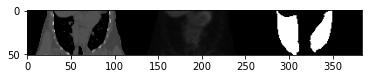


0.0 1.0
0.0 0.9200415
LC02141
65 140 203 63
10


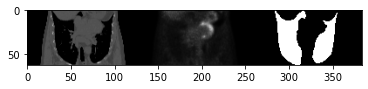


0 264 0
LC02145-Can not detect lung
0.0 1.0
0.0 1.0
LC02146
61 108 174 66
11


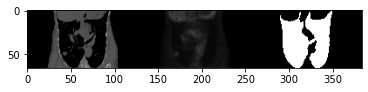


0.0 1.0
0.0 1.0
LC02147
66 216 270 54
11


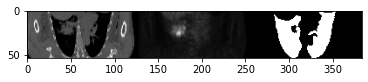


0.0 1.0
0.0 0.31595814
LC02153
65 201 281 80
11


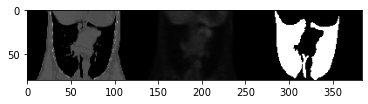


0.0 1.0
0.0 0.8428602
LC02156
65 208 253 45
11


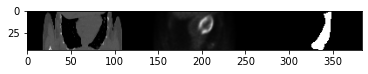


0.0 1.0
0.0 0.8613544
LC02158
66 204 270 66
11


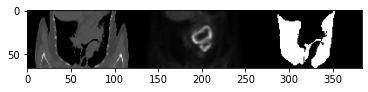


0.0 1.0
0.0 0.7556078
LC02159
66 178 229 51
11


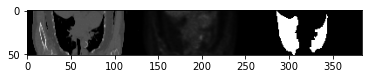


0.0 1.0
0.0 0.77089757
LC02161
66 130 191 61
11


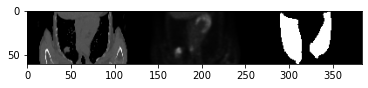


0.0 1.0
0.0 1.0
LC02163
65 210 273 63
11


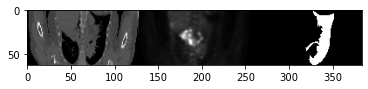


0.0 1.0
0.0 1.0
LC02166
66 219 278 59
11


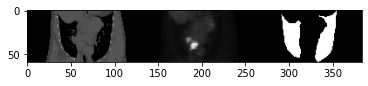


0.0 1.0
0.0 0.2773217
LC02172
66 141 195 54
11


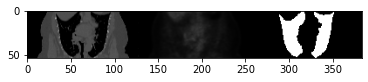


0.0 1.0
0.0 1.0
LC02182
65 125 193 68
11


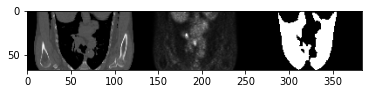


0.0 1.0
0.0 1.0
LC02192
61 210 295 85
11


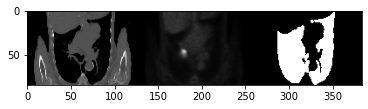


0.0 1.0
0.0 1.0
LC02194
65 137 206 69
11


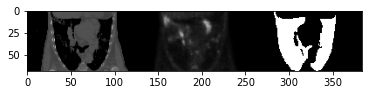


0.0 0.996
0.0 1.0
LC02197
66 149 190 41
11


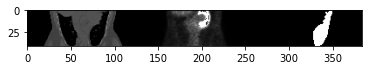


0.0 1.0
0.0 0.49275187
LC02201
65 158 214 56
11


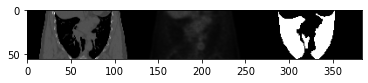


0.0 1.0
0.0 1.0
LC02202
66 209 282 73
11


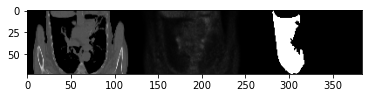


0.0 1.0
0.0 1.0
LC02204
65 205 277 72
11


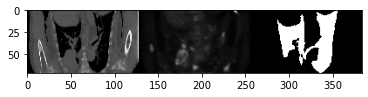


0.0 1.0
0.0 1.0
LC02206
65 199 264 65
11


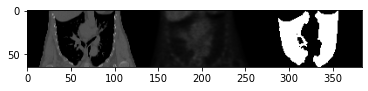


0.0 1.0
0.0 1.0
LC02213
66 194 252 58
11


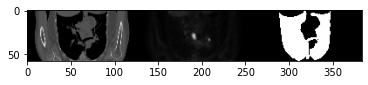


0.0 0.994
0.0 0.34928435
LC02216
66 113 163 50
11


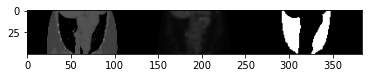


0.0 1.0
0.0 1.0
LC02220
61 225 291 66
11


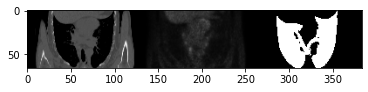


0.0 1.0
0.0 1.0
LC02226
62 187 251 64
11


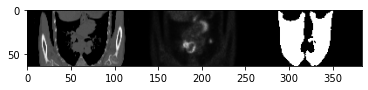


0.0 0.9115
0.0 1.0
LC02227
66 217 268 51
11


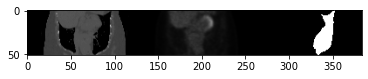


0.0 1.0
0.0 0.63670766
LC02230
66 212 280 68
11


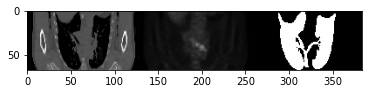


0.0 1.0
0.0 0.31717888
LC02238
65 154 216 62
11


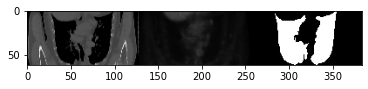


0.0 1.0
0.0 0.8205817
LC02239
65 197 251 54
11


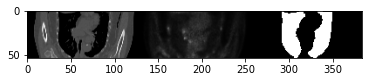


0.0 1.0
0.0 1.0
LC02245
63 195 262 67
11


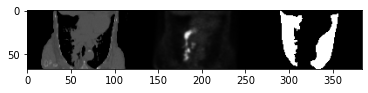


0.0 1.0
0.0 0.8698996
LC02248
65 115 192 77
11


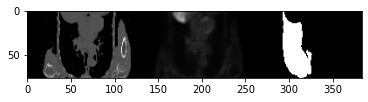


0.0 1.0
0.0 1.0
LC02253
65 202 266 64
11


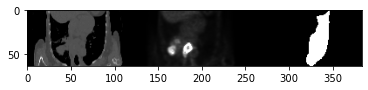


0.0 1.0
0.0 0.84249395
LC02255
65 199 244 45
11


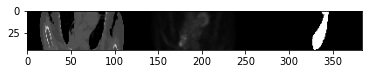


0.0 1.0
0.0 0.6484268
LC02256
66 233 293 60
11


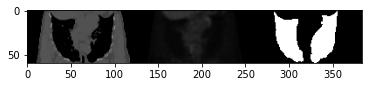


0.0 0.942
0.0 0.83278906
LC02259
66 131 179 48
11


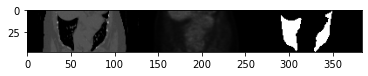


0.0 1.0
0.0 0.8209479
LC02260
66 222 279 57
11


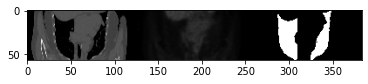


0.0 1.0
0.0 0.538255
LC02276
66 120 174 54
11


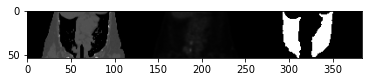


0.0 1.0
0.0 1.0
LC02277
66 137 200 63
11


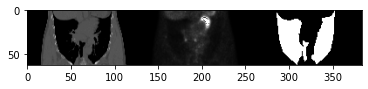


0.0 1.0
0.0 1.0
LC02279
61 198 272 74
11


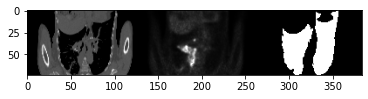


0.0 1.0
0.0 0.27292702
LC02280
63 221 263 42
11


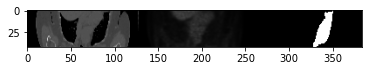


0.0 1.0
0.0 1.0
LC02281
65 214 274 60
11


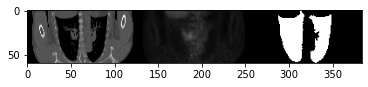


0 337 0
LC02286-Can not detect lung
0.0 1.0
0.0 0.7578051
LC02290
65 219 276 57
12


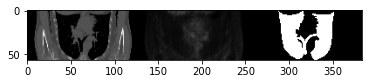


0.0 1.0
0.0 1.0
LC02291
61 179 250 71
12


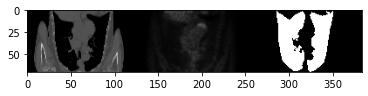


0.0 0.9435
0.0 0.41773736
LC02297
66 204 262 58
12


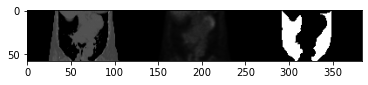


0.0 1.0
0.0 1.0
LC02301
66 196 268 72
12


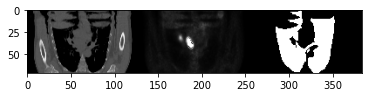


0.0 1.0
0.0 0.8503677
LC02305
63 231 290 59
12


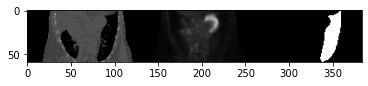


0.0 1.0
0.0 1.0
LC02306
66 218 276 58
12


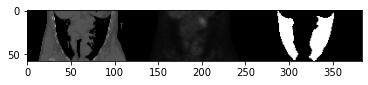


0.0 1.0
0.0 0.72801906
LC02311
66 152 203 51
12


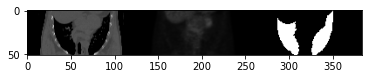


0.0 1.0
0.0 0.49345377
LC02314
65 117 186 69
12


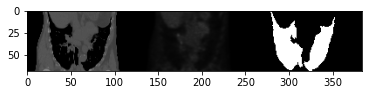


0.0 1.0
0.0 1.0
LC02323
61 138 205 67
12


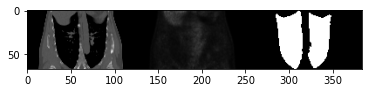


0.0 1.0
0.0 0.7762993
LC02328
66 123 178 55
12


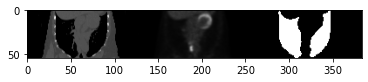


0.0 0.9545
0.0 1.0
LC02335
65 230 280 50
12


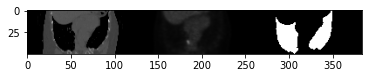


0.0 1.0
0.0 1.0
LC02341
66 209 260 51
12


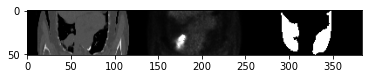


0.0 1.0
0.0 0.5228126
LC02342
65 137 200 63
12


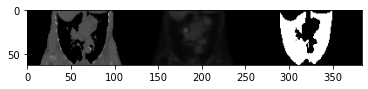


0.0 1.0
0.0 0.9862972
LC02343
64 206 280 74
12


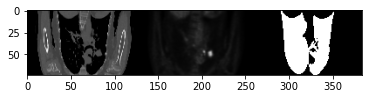


0.0 1.0
0.0 1.0
LC02349
66 223 271 48
12


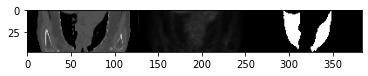


0.0 1.0
0.0 1.0
LC02362
64 189 255 66
12


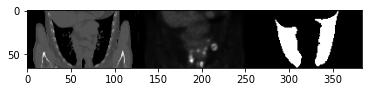


0.0 1.0
0.0 1.0
LC02368
65 140 206 66
12


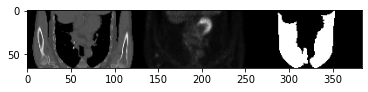


0.0 1.0
0.0 0.83315533
LC02377
66 200 270 70
12


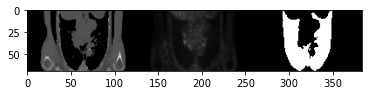


0.0 1.0
0.0 0.26880702
LC02380
65 202 261 59
12


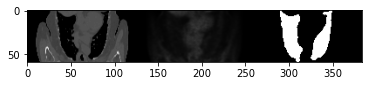


0.0 1.0
0.0 0.71700186
LC02386
66 143 207 64
12


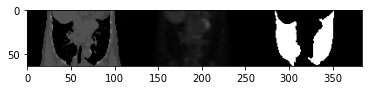


0.0 1.0
0.0 0.7694937
LC02387
66 215 280 65
12


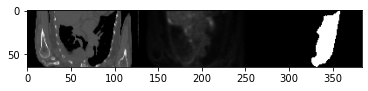


0.0 1.0
0.0 1.0
LC02390
64 208 271 63
12


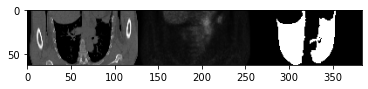


0.0 1.0
0.0 0.4801172
LC02392
66 209 263 54
12


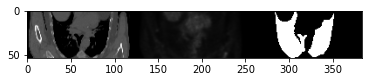


0.0 1.0
0.0 1.0
LC02396
66 177 237 60
12


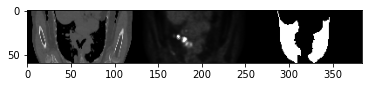


0.0 0.935
0.0 1.0
LC02404
62 201 253 52
12


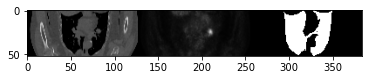


0.0 1.0
0.0 0.40937528
LC02407
66 157 212 55
12


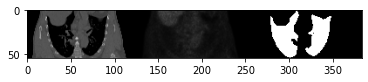


0.0 0.9985
0.0 0.6552629
LC02411
66 136 182 46
12


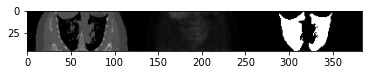


0.0 1.0
0.0 1.0
LC02412
66 133 196 63
12


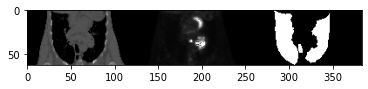


0.0 1.0
0.0 1.0
LC02413
61 197 282 85
12


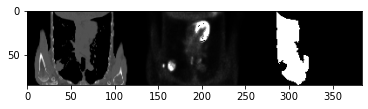


0.0 1.0
0.0 0.31662953
LC02421
64 141 193 52
12


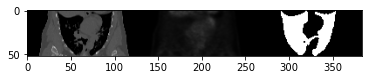


0.0 1.0
0.0 1.0
LC02424
64 193 250 57
12


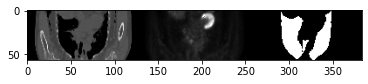


0.0 1.0
0.0 1.0
LC02425
65 117 163 46
12


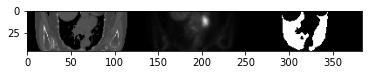


0.0 1.0
0.0 0.6985382
LC02428
66 122 174 52
12


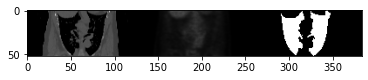


0.0 1.0
0.0 1.0
LC02434
66 223 276 53
12


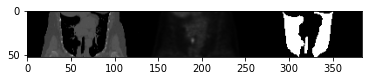


0.0 1.0
0.0 1.0
LC02438
66 143 206 63
12


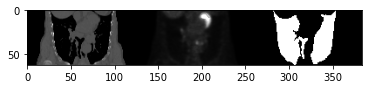


0.0 1.0
0.0 1.0
LC02443
64 211 274 63
12


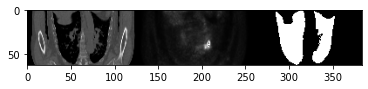


0.0 1.0
0.0 0.40101323
LC02448
66 228 291 63
12


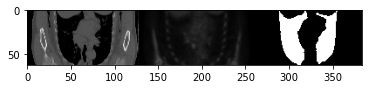


0.0 1.0
0.0 0.87823117
LC02450
66 207 262 55
12


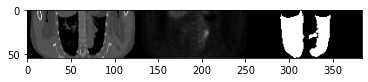


0.0 1.0
0.0 1.0
LC02455
65 221 291 70
12


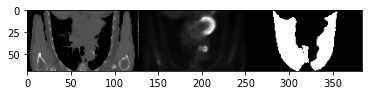


0.0 1.0
0.0 1.0
LC02456
65 148 206 58
12


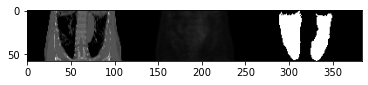


0.0 1.0
0.0 1.0
LC02458
61 142 203 61
12


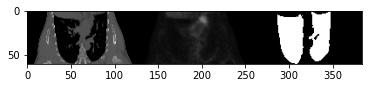


0.0 1.0
0.0 1.0
LC02464
66 201 274 73
12


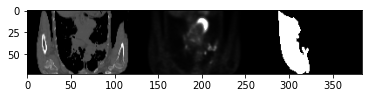


0.0 1.0
0.0 1.0
LC02465
66 169 224 55
12


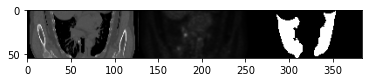


0.0 1.0
0.0 0.7140416
LC02468
66 144 198 54
12


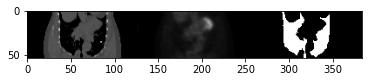


0.0 1.0
0.0 1.0
LC02469
64 203 262 59
12


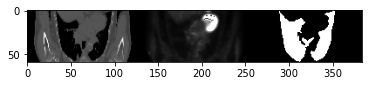


0.0 1.0
0.0 1.0
LC02472
63 219 268 49
12


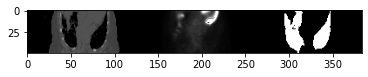


0.0 1.0
0.0 1.0
LC02475
64 139 209 70
12


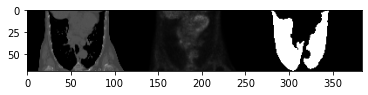


0.0 1.0
0.0 1.0
LC02480
65 221 276 55
12


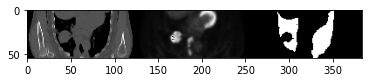


0.0 1.0
0.0 1.0
LC02483
66 222 272 50
12


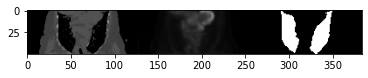


0.0 1.0
0.0 1.0
LC02489
62 209 272 63
12


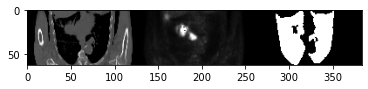


0.0 1.0
0.0 0.9297769
LC02492
61 206 277 71
12


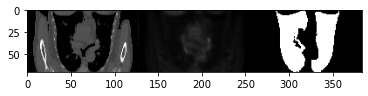


0.0 1.0
0.0 1.0
LC02506
63 223 296 73
12


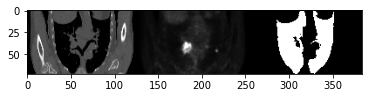


0.0 1.0
0.0 1.0
LC02507
65 140 206 66
12


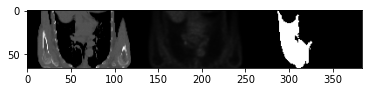


0.0 1.0
0.0 1.0
LC02514
62 134 188 54
12


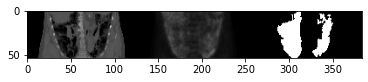


0.0 1.0
0.0 0.5409711
LC02519
65 225 281 56
12


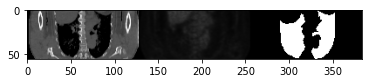


0.0 1.0
0.0 0.8794824
LC02530
61 160 224 64
12


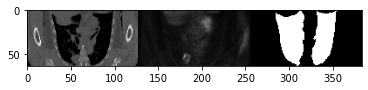


0.0 1.0
0.0 1.0
LC02532
61 188 252 64
12


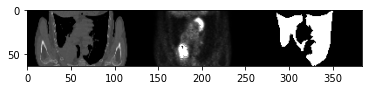


0.0 1.0
0.0 1.0
LC02535
66 213 275 62
12


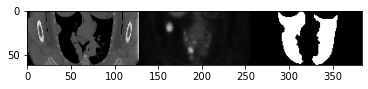


0.0 1.0
0.0 1.0
LC02539
66 205 279 74
12


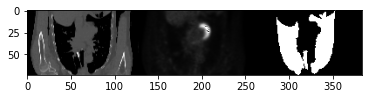


0.0 1.0
0.0 1.0
LC02543
66 220 282 62
12


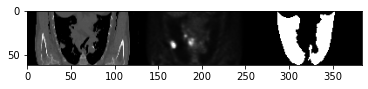


0.0 1.0
0.0 1.0
LC02544
64 113 196 83
12


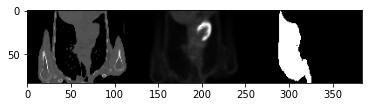


0.0 1.0
0.0 0.6341441
LC02545
64 198 255 57
12


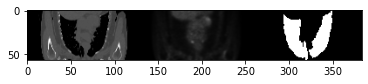


0.0 1.0
0.0 0.49604785
LC02550
61 209 273 64
12


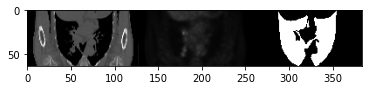


0.0 1.0
0.0 1.0
LC02551
64 216 298 82
12


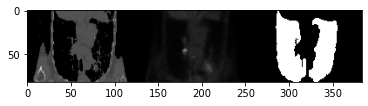


0.0 1.0
0.0 1.0
LC02559
65 195 263 68
12


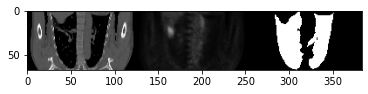


0.0 1.0
0.0 0.7327799
LC02565
63 214 277 63
12


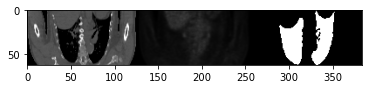


0.0 1.0
0.0 1.0
LC02572
66 166 230 64
12


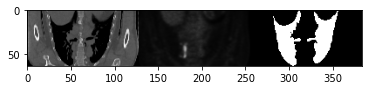


0.0 1.0
0.0 0.42323068
LC02577
65 211 268 57
12


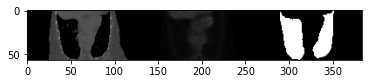


0.0 1.0
0.0 0.76546526
LC02579
61 113 170 57
12


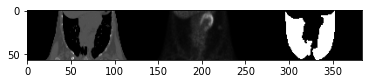


0.0 1.0
0.0 0.9114353
LC02585
66 118 177 59
12


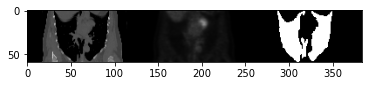


0.0 1.0
0.0 0.71684927
LC02587
66 124 177 53
12


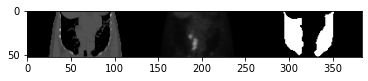


0.0 1.0
0.0 1.0
LC02589
65 222 280 58
12


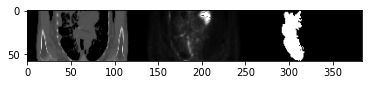


0.0 1.0
0.0 1.0
LC02591
66 141 204 63
12


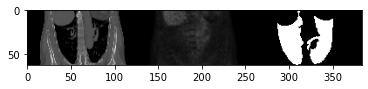


0 337 0
LC02592-Can not detect lung
0.0 1.0
0.0 0.29126865
LC02593
65 197 256 59
13


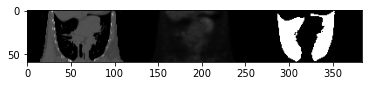


0.0 1.0
0.0 1.0
LC02595
65 147 215 68
13


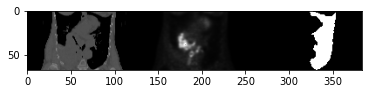


0.0 1.0
0.0 0.9320658
LC02596
64 208 275 67
13


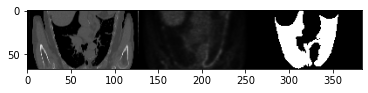


0.0 1.0
0.0 1.0
LC02613
66 180 231 51
13


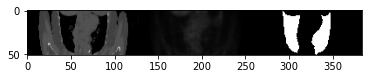


0.0 1.0
0.0 0.35798213
LC02616
65 222 265 43
13


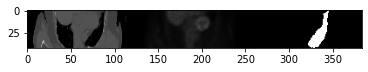


0.0 1.0
0.0 0.44212165
LC02621
64 206 261 55
13


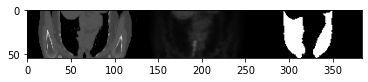


0.0 1.0
0.0 0.93276775
LC02623
65 201 267 66
13


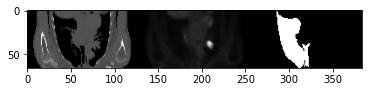


0.0 1.0
0.0 0.95092624
LC02624
61 219 274 55
13


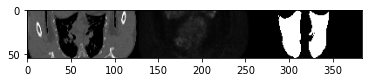


0.0 1.0
0.0 1.0
LC02630
61 142 206 64
13


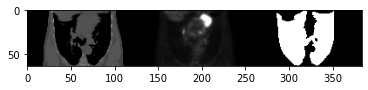


0.0 1.0
0.0 1.0
LC02645
66 178 232 54
13


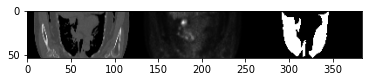


0.0 1.0
0.0 0.34745324
LC02650
62 229 295 66
13


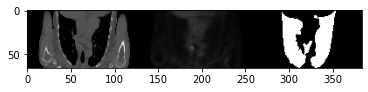


0.0 1.0
0.0 1.0
LC02670
65 193 266 73
13


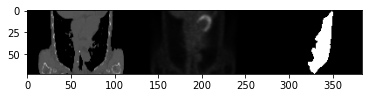


0.0 1.0
0.0 1.0
LC02671
61 211 279 68
13


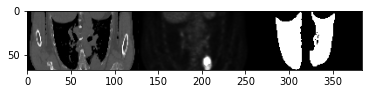


0.0 1.0
0.0 0.75371563
LC02673
66 143 210 67
13


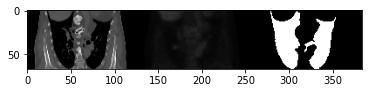


0.0 1.0
0.0 1.0
LC02678
65 207 272 65
13


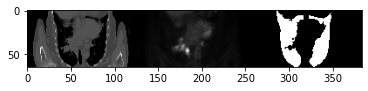


0.0 1.0
0.0 1.0
LC02681
66 224 298 74
13


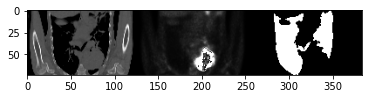


0.0 1.0
0.0 0.3030488
LC02683
66 137 196 59
13


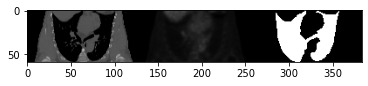


0.0 1.0
0.0 0.43772697
LC02687
64 218 279 61
13


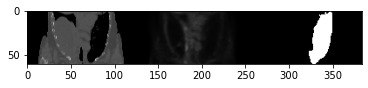


0.0 1.0
0.0 1.0
LC02692
66 138 200 62
13


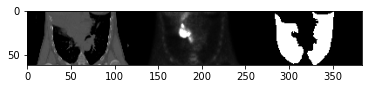


0.0 1.0
0.0 0.7669607
LC02693
65 143 201 58
13


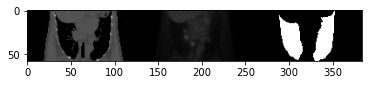


0.0 1.0
0.0 0.95724356
LC02694
66 209 268 59
13


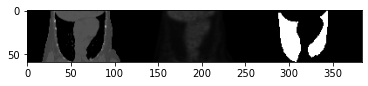


0.0 1.0
0.0 0.31174657
LC02696
66 209 255 46
13


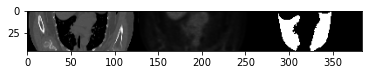


0.0 1.0
0.0 0.7453841
LC02699
65 214 287 73
13


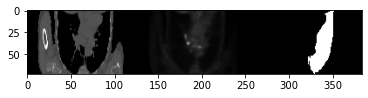


0.0 1.0
0.0 1.0
LC02700
61 200 273 73
13


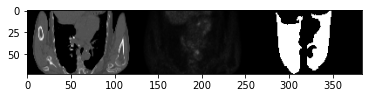


0.0 1.0
0.0 1.0
LC02703
64 195 260 65
13


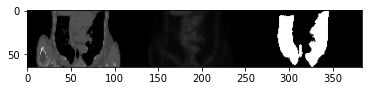


0.0 1.0
0.0 1.0
LC02704
64 225 287 62
13


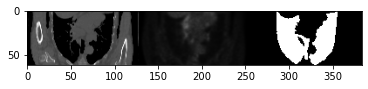


0.0 1.0
0.0 0.8161565
LC02705
65 176 235 59
13


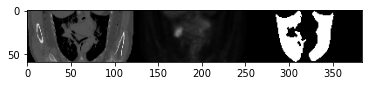


0 252 0
LC02706-Can not detect lung
0 287 0
LC02715-Can not detect lung
0.0 1.0
0.0 0.43110445
LC02718
66 141 193 52
15


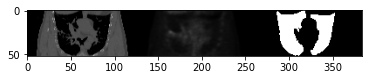


0.0 1.0
0.0 1.0
LC02720
61 201 268 67
15


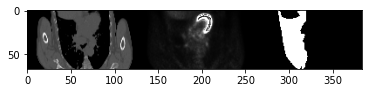


0.0 1.0
0.0 1.0
LC02722
65 199 273 74
15


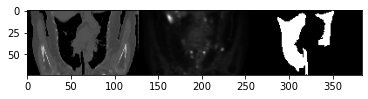


0 306 0
LC02724-Can not detect lung
0.0 1.0
0.0 0.68633074
LC02731
65 234 293 59
16


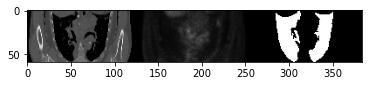


0.0 1.0
0.0 1.0
LC02732
63 201 263 62
16


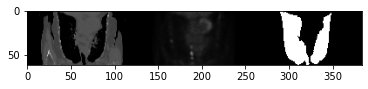


0.0 1.0
0.0 1.0
LC02734
66 204 267 63
16


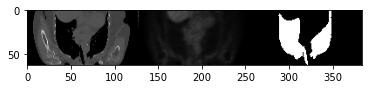


0.0 1.0
0.0 1.0
LC02738
66 138 196 58
16


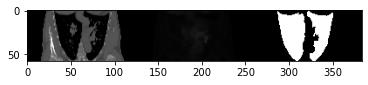


0.0 1.0
0.0 1.0
LC02739
64 216 276 60
16


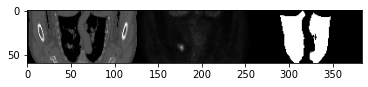


0.0 1.0
0.0 0.72743917
LC02749
66 201 267 66
16


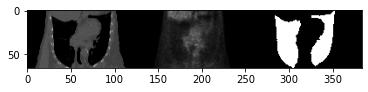


0.0 1.0
0.0 0.38712728
LC02751
64 212 266 54
16


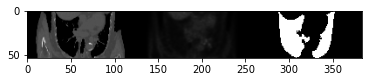


0.0 1.0
0.0 0.9512314
LC02758
65 127 176 49
16


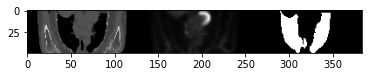


0.0 1.0
0.0 1.0
LC02759
66 218 278 60
16


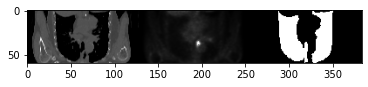


0.0 1.0
0.0 0.62977993
LC02768
65 135 200 65
16


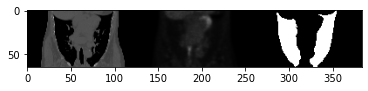


0.0 1.0
0.0 1.0
LC02771
64 196 279 83
16


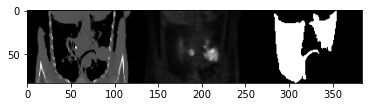


0.0 1.0
0.0 0.91238135
LC02772
66 200 280 80
16


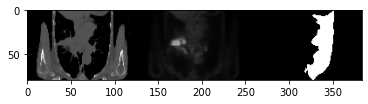


0.0 1.0
0.0 1.0
LC02774
61 203 282 79
16


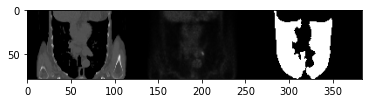


0.0 1.0
0.0 1.0
LC02779
64 236 305 69
16


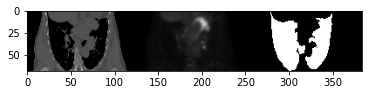


0.0 1.0
0.0 1.0
LC02780
64 222 281 59
16


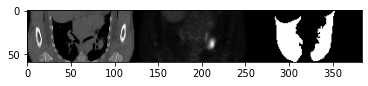


0.0 1.0
0.0 0.82070374
LC02791
61 180 260 80
16


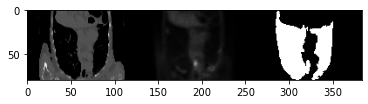


0.0 1.0
0.0 1.0
LC02800
61 212 277 65
16


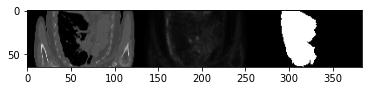


0.0 1.0
0.0 1.0
LC02804
66 221 274 53
16


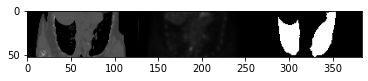


0.0 1.0
0.0 1.0
LC02806
61 229 290 61
16


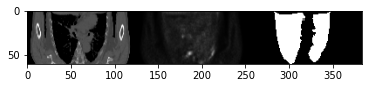


0.0 1.0
0.0 0.435255
LC02807
65 217 269 52
16


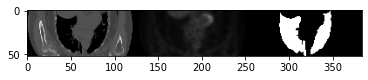


0.0 1.0
0.0 0.68941313
LC02810
66 195 260 65
16


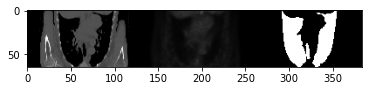


0.0 1.0
0.0 1.0
LC02811
63 176 233 57
16


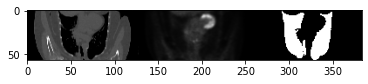


0.0 1.0
0.0 1.0
LC02813
66 223 292 69
16


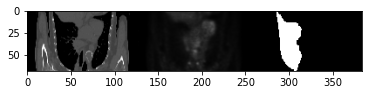


0.0 1.0
0.0 0.37913144
LC02821
61 209 270 61
16


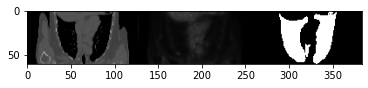


0.0 1.0
0.0 0.7928709
LC02822
66 205 276 71
16


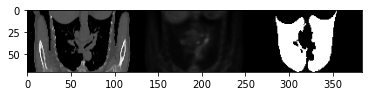


0.0 1.0
0.0 0.794763
LC02823
62 140 200 60
16


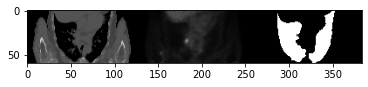


0.0 1.0
0.0 1.0
LC02824
62 224 297 73
16


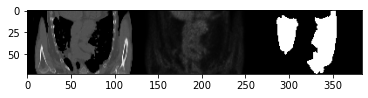


0.0 1.0
0.0 1.0
LC02826
66 218 275 57
16


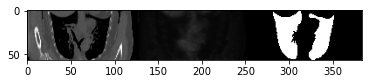


0.0 1.0
0.0 1.0
LC02830
65 121 187 66
16


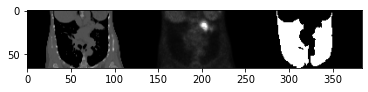


0.0 1.0
0.0 1.0
LC02834
61 222 289 67
16


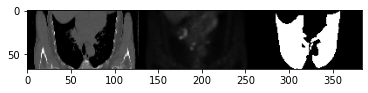


0.0 1.0
0.0 0.46357617
LC02840
66 195 252 57
16


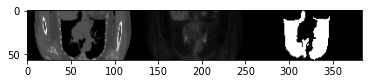


0.0 1.0
0.0 1.0
LC02842
64 206 281 75
16


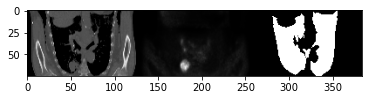


0.0 1.0
0.0 1.0
LC02846
64 151 221 70
16


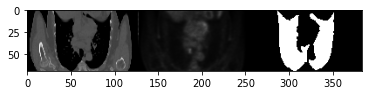


0.0 1.0
0.0 1.0
LC02852
64 219 265 46
16


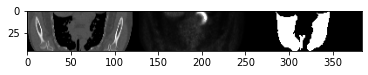


0.0 1.0
0.0 0.8438673
LC02854
61 209 267 58
16


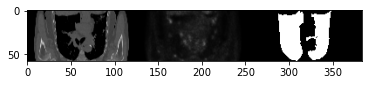


0.0 1.0
0.0 1.0
LC02866
62 178 232 54
16


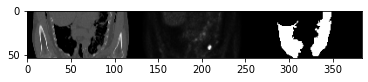


0.0 1.0
0.0 1.0
LC02867
63 210 274 64
16


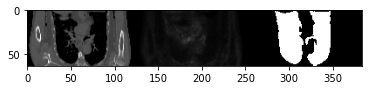


0.0 1.0
0.0 0.5600452
LC02869
66 142 193 51
16


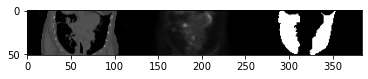


0.0 1.0
0.0 0.76198614
LC02872
61 197 276 79
16


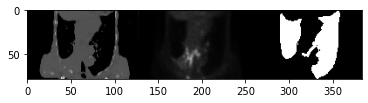


0.0 1.0
0.0 0.56065553
LC02878
64 215 263 48
16


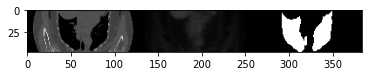


0.0 1.0
0.0 0.5258339
LC02879
62 210 273 63
16


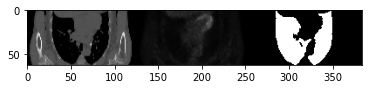


0.0 1.0
0.0 0.50682086
LC02881
64 233 294 61
16


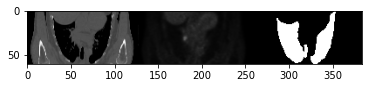


0.0 1.0
0.0 0.3330485
LC02884
66 120 167 47
16


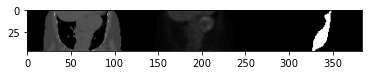


0.0 1.0
0.0 0.71413314
LC02887
66 202 281 79
16


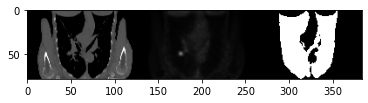


0.0 1.0
0.0 0.79464096
LC02889
63 193 269 76
16


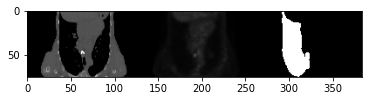


0.0 1.0
0.0 1.0
LC02891
63 211 276 65
16


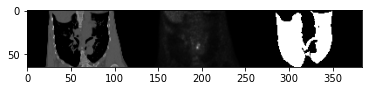


0.0 1.0
0.0 1.0
LC02892
66 133 191 58
16


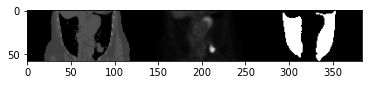


0.0 1.0
0.0 0.7491379
LC02895
66 203 286 83
16


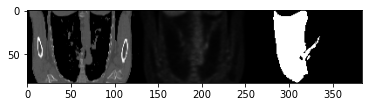


0.0 1.0
0.0 0.72490615
LC02899
62 197 258 61
16


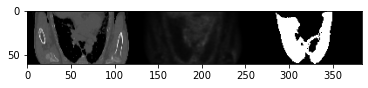


0.0 1.0
0.0 1.0
LC02900
65 185 247 62
16


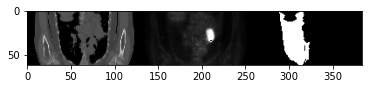


0.0 1.0
0.0 1.0
LC02902
66 210 294 84
16


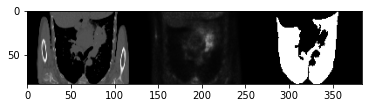


0.0 1.0
0.0 1.0
LC02908
66 199 266 67
16


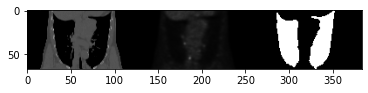


0.0 1.0
0.0 1.0
LC02913
66 215 277 62
16


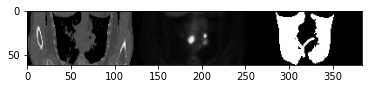


0.0 1.0
0.0 0.753441
LC02918
66 203 263 60
16


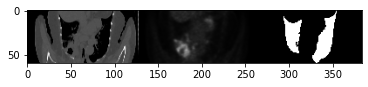


0.0 1.0
0.0 0.7696463
LC02919
65 191 269 78
16


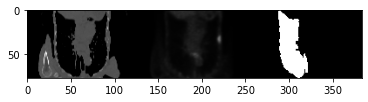


0.0 1.0
0.0 1.0
LC02925
66 228 282 54
16


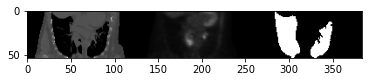


0.0 1.0
0.0 0.8633076
LC02928
65 146 192 46
16


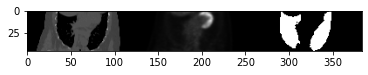


0.0 1.0
0.0 0.8044679
LC02930
61 233 302 69
16


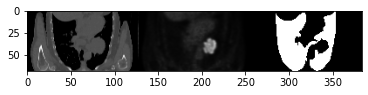


0.0 1.0
0.0 0.29425946
LC02931
66 149 202 53
16


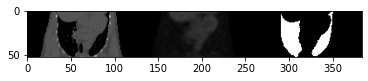


0.0 1.0
0.0 0.55568105
LC02934
64 137 207 70
16


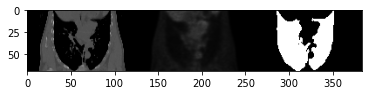


0.0 1.0
0.0 0.7968383
LC02937
65 221 293 72
16


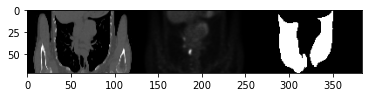


0.0 1.0
0.0 0.8821986
LC02940
66 202 250 48
16


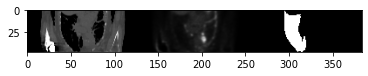


0.0 1.0
0.0 0.36298716
LC02944
65 214 276 62
16


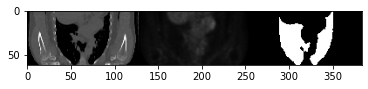


0.0 1.0
0.0 0.68980986
LC02954
66 207 274 67
16


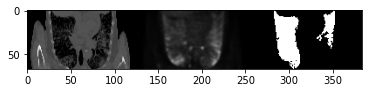


0.0 1.0
0.0 1.0
LC02958
63 209 261 52
16


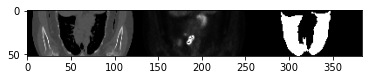


0.0 1.0
0.0 1.0
LC02962
65 223 276 53
16


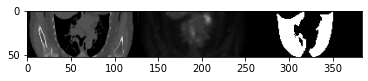


0.0 1.0
0.0 0.95812863
LC02963
61 209 273 64
16


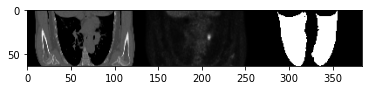


0.0 1.0
0.0 0.8189642
LC02966
64 221 275 54
16


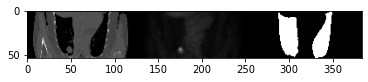


0.0 0.6335
0.0 1.0
LC02972
66 148 192 44
16


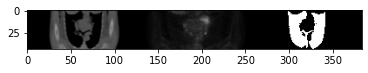


0.0 1.0
0.0 1.0
LC02974
61 193 249 56
16


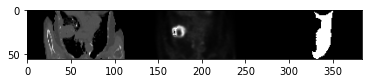


0.0 1.0
0.0 0.53416544
LC02977
61 139 200 61
16


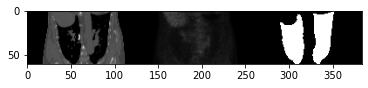


0.0 1.0
0.0 0.95971555
LC02990
65 205 272 67
16


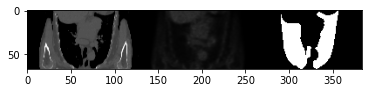


0.0 0.9915
0.0 0.2338023
LC02994
65 144 195 51
16


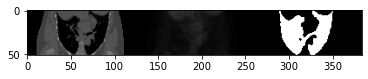


0.0 1.0
0.0 1.0
LC03003
66 189 247 58
16


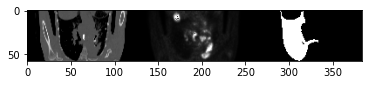


0.0 0.944
0.0 1.0
LC03005
66 191 234 43
16


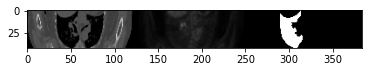


0.0 1.0
0.0 1.0
LC03008
66 239 288 49
16


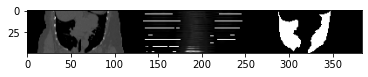


0.0 1.0
0.0 0.8489334
LC03013
63 214 277 63
16


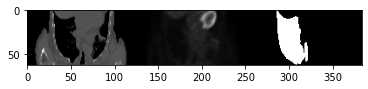


0.0 1.0
0.0 0.3592639
LC03015
66 135 208 73
16


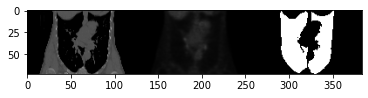


0.0 1.0
0.0 1.0
LC03016
65 171 238 67
16


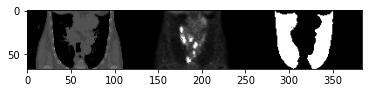


0.0 1.0
0.0 1.0
LC03019
64 181 260 79
16


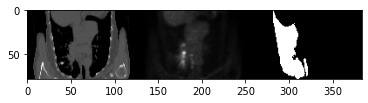


0.0 1.0
0.0 1.0
LC03021
65 121 186 65
16


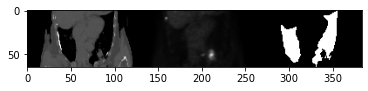


0.0 1.0
0.0 0.39484847
LC03023
66 149 208 59
16


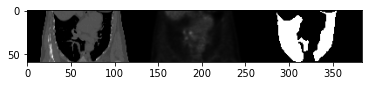


0.0 0.996
0.0 1.0
LC03026
63 124 179 55
16


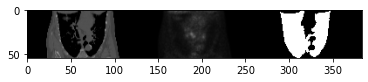


0.0 1.0
0.0 1.0
LC03029
63 170 239 69
16


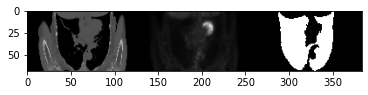


0.0 1.0
0.0 1.0
LC03030
61 208 282 74
16


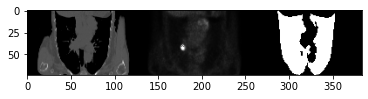


0.0 1.0
0.0 0.9708548
LC03044
65 190 262 72
16


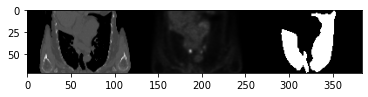


0.0 1.0
0.0 0.56050295
LC03045
66 251 297 46
16


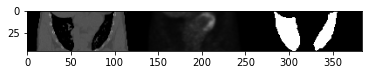


0.0 1.0
0.0 1.0
LC03048
64 222 296 74
16


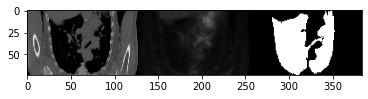


0.0 1.0
0.0 0.41370893
LC03049
65 189 251 62
16


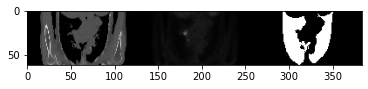


0.0 1.0
0.0 0.28717917
LC03053
65 128 170 42
16


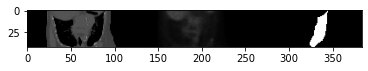


0.0 1.0
0.0 0.5222022
LC03056
66 136 192 56
16


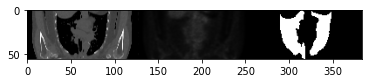


0.0 1.0
0.0 0.8584552
LC03058
65 208 260 52
16


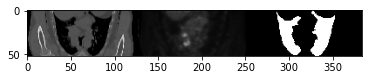


0.0 1.0
0.0 1.0
LC03061
62 142 210 68
16


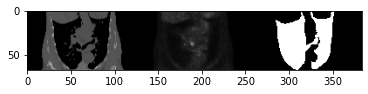


0.0 1.0
0.0 0.3894162
LC03062
65 145 207 62
16


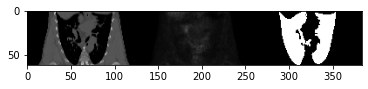


0.0 1.0
0.0 0.2776879
LC03064
64 154 223 69
16


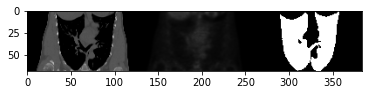


0.0 1.0
0.0 0.37565234
LC03070
65 123 191 68
16


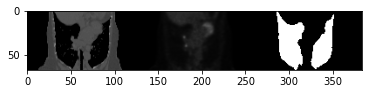


0.0 1.0
0.0 1.0
LC03071
66 213 277 64
16


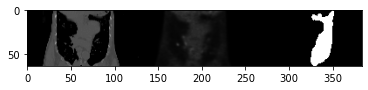


0.0 1.0
0.0 1.0
LC03072
63 185 261 76
16


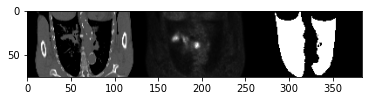


0.0 1.0
0.0 1.0
LC03073
66 221 276 55
16


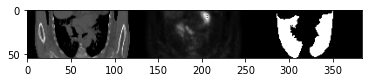


0.0 1.0
0.0 0.46925262
LC03080
64 145 205 60
16


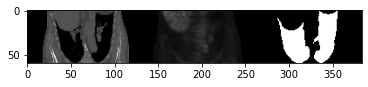


0.0 1.0
0.0 1.0
LC03081
65 206 278 72
16


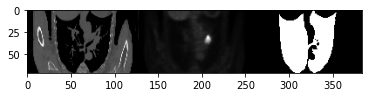


0.0 1.0
0.0 0.5382855
LC03084
66 153 207 54
16


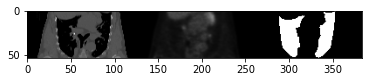


0.0 1.0
0.0 1.0
LC03085
65 201 275 74
16


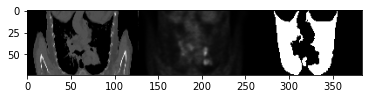


0 322 0
LC03088-Can not detect lung
0.0 1.0
0.0 1.0
LC03089
66 217 267 50
17


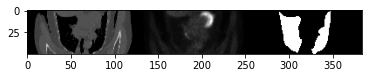


0.0 1.0
0.0 0.60515153
LC03091
63 118 198 80
17


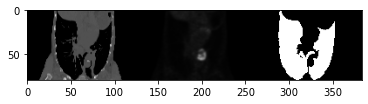


0.0 1.0
0.0 1.0
LC03094
64 205 265 60
17


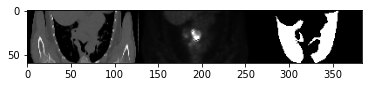


0.0 1.0
0.0 1.0
LC03111
65 141 206 65
17


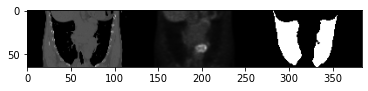


0.0 1.0
0.0 1.0
LC03113
63 119 193 74
17


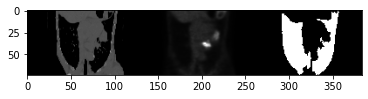


0.0 1.0
0.0 1.0
LC03115
66 232 294 62
17


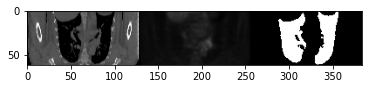


0.0 1.0
0.0 0.8529008
LC03119
62 211 275 64
17


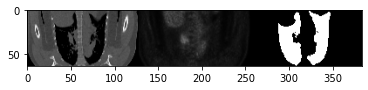


0.0 1.0
0.0 0.8264412
LC03120
65 217 278 61
17


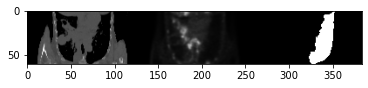


0.0 1.0
0.0 1.0
LC03123
66 141 199 58
17


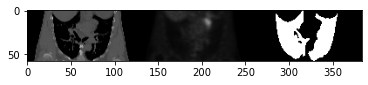


0.0 1.0
0.0 0.7542039
LC03131
66 199 251 52
17


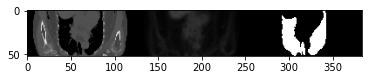


0.0 1.0
0.0 0.62285227
LC03132
65 142 203 61
17


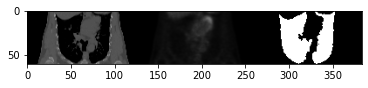


0.0 1.0
0.0 1.0
LC03134
61 203 270 67
17


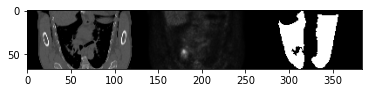


0.0 1.0
0.0 0.76760155
LC03137
63 210 273 63
17


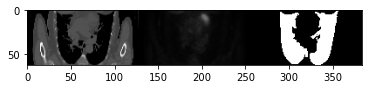


0.0 1.0
0.0 0.6755272
LC03142
65 130 199 69
17


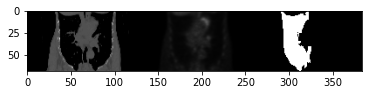


0.0 1.0
0.0 0.4453566
LC03149
66 129 182 53
17


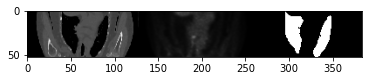


0.0 1.0
0.0 0.8182623
LC03156
66 225 292 67
17


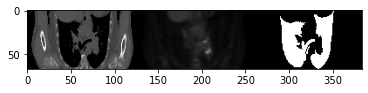


0.0 1.0
0.0 1.0
LC03159
64 156 226 70
17


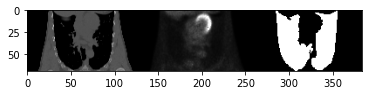


0.0 1.0
0.0 1.0
LC03163
66 213 269 56
17


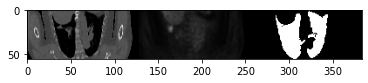


0.0 1.0
0.0 0.51982176
LC03168
66 137 192 55
17


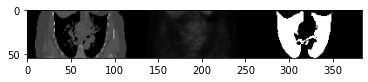


0.0 1.0
0.0 1.0
LC03174
61 198 264 66
17


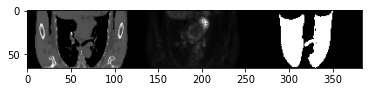


0.0 1.0
0.0 1.0
LC03176
61 206 276 70
17


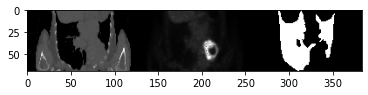


0.0 1.0
0.0 1.0
LC03179
66 125 182 57
17


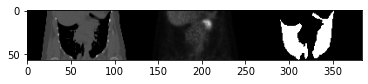


0.0 1.0
0.0 0.70546585
LC03186
66 149 207 58
17


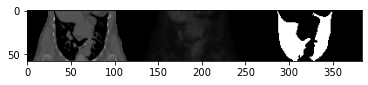


0.0 1.0
0.0 1.0
LC03187
66 203 268 65
17


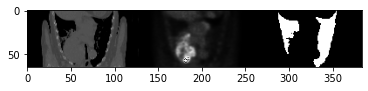


0.0 1.0
0.0 1.0
LC03193
66 208 278 70
17


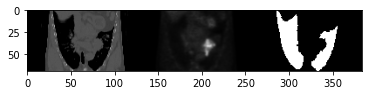


0.0 1.0
0.0 1.0
LC03210
66 198 257 59
17


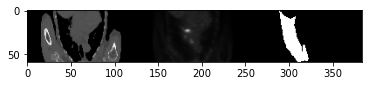


0.0 1.0
0.0 1.0
LC03214
65 204 266 62
17


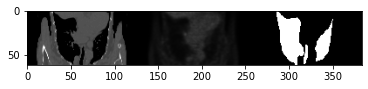


0 337 0
LC03226-Can not detect lung
0.0 1.0
0.0 0.8867153
LC03227
66 203 250 47
18


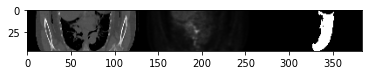


0.0 1.0
0.0 0.94982755
LC03243
66 125 180 55
18


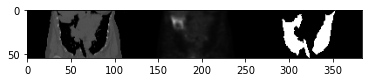


0.0 1.0
0.0 0.95974606
LC03255
66 148 208 60
18


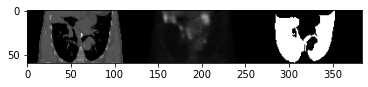


0.0 1.0
0.0 0.89367354
LC03257
66 116 164 48
18


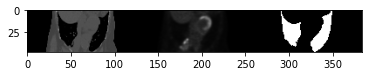


0.0 1.0
0.0 0.19864498
LC03260
65 121 176 55
18


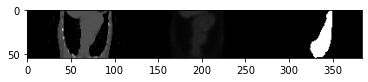


0.0 1.0
0.0 1.0
LC03264
65 203 255 52
18


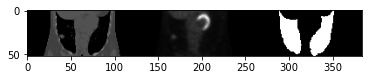


0.0 1.0
0.0 0.6708273
LC03268
64 120 177 57
18


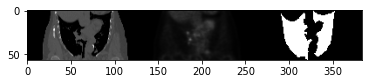


0.0 1.0
0.0 1.0
LC03269
65 194 249 55
18


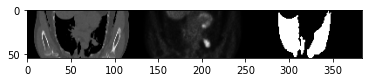


0.0 1.0
0.0 1.0
LC03271
65 206 265 59
18


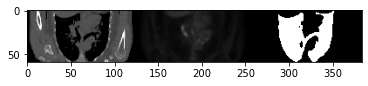


0.0 1.0
0.0 1.0
LC03280
61 197 261 64
18


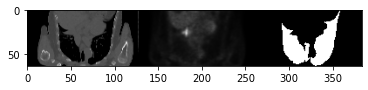


0.0 1.0
0.0 1.0
LC03285
66 217 277 60
18


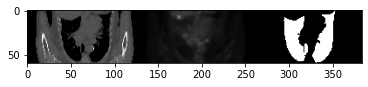


0.0 1.0
0.0 1.0
LC03286
62 118 187 69
18


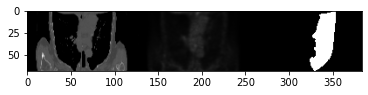


0.0 1.0
0.0 1.0
LC03287
61 165 233 68
18


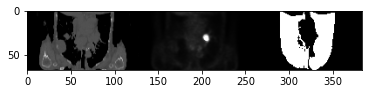


0.0 1.0
0.0 0.84374523
LC03291
65 129 201 72
18


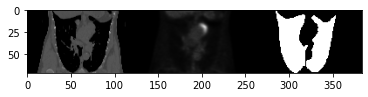


0.0 1.0
0.0 0.5553453
LC03303
61 218 281 63
18


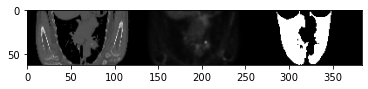


0.0 1.0
0.0 0.59471416
LC03309
66 144 204 60
18


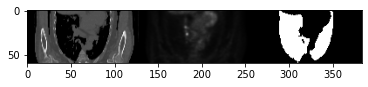


0.0 1.0
0.0 1.0
LC03311
66 130 201 71
18


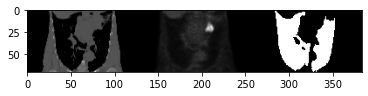


0.0 0.9975
0.0 0.3080233
LC03314
66 133 198 65
18


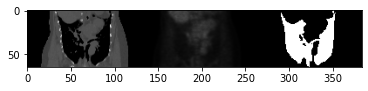


0.0 1.0
0.0 0.80962557
LC03316
66 181 258 77
18


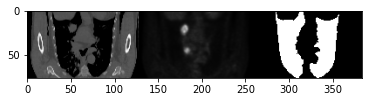


0.0 1.0
0.0 0.96609396
LC03320
66 204 264 60
18


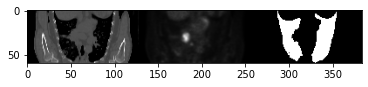


0.0 1.0
0.0 0.87508774
LC03324
64 228 294 66
18


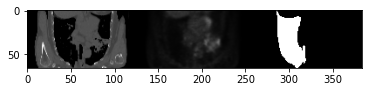


0.0 1.0
0.0 0.34400463
LC03327
66 148 204 56
18


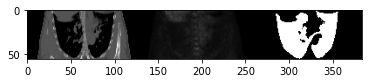


0.0 1.0
0.0 1.0
LC03329
66 202 260 58
18


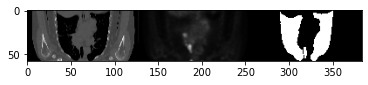


0.0 1.0
0.0 0.5836665
LC03335
65 141 196 55
18


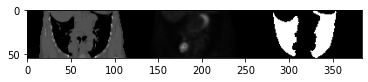


0.0 1.0
0.0 0.579516
LC03341
61 199 262 63
18


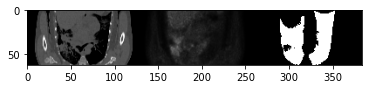


0.0 1.0
0.0 1.0
LC03342
65 126 184 58
18


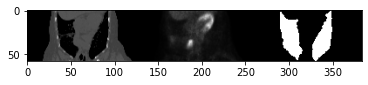


0.0 1.0
0.0 1.0
LC03345
66 185 254 69
18


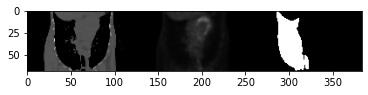


0.0 1.0
0.0 1.0
LC03346
66 222 275 53
18


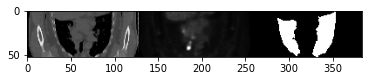


0.0 1.0
0.0 1.0
LC03348
65 189 259 70
18


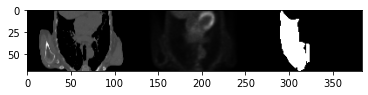


0.0 1.0
0.0 1.0
LC03351
66 205 267 62
18


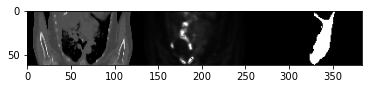


0.0 1.0
0.0 1.0
LC03354
64 121 175 54
18


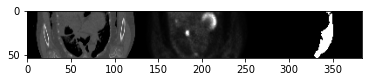


0.0 1.0
0.0 1.0
LC03355
66 204 276 72
18


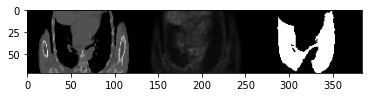


0.0 1.0
0.0 1.0
LC03357
61 223 270 47
18


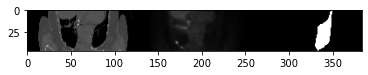


0.0 1.0
0.0 0.8923612
LC03366
66 206 280 74
18


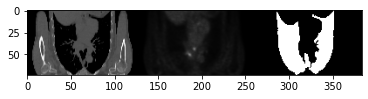


0.0 1.0
0.0 1.0
LC03370
61 204 282 78
18


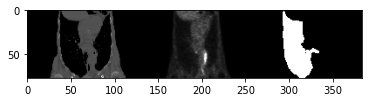


0.0 1.0
0.0 1.0
LC03388
66 225 275 50
18


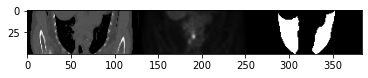


0.0 1.0
0.0 1.0
LC03390
64 185 235 50
18


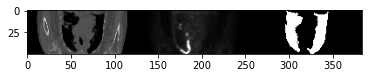


0.0 1.0
0.0 1.0
LC03392
66 140 205 65
18


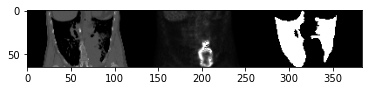


0.0 1.0
0.0 1.0
LC03398
65 212 276 64
18


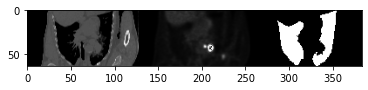


0.0 1.0
0.0 0.9437849
LC03402
64 224 279 55
18


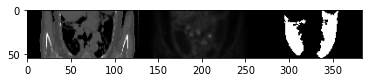


0.0 1.0
0.0 0.63631094
LC03406
65 215 265 50
18


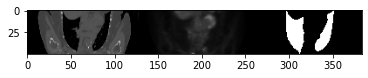


0.0 1.0
0.0 0.39783928
LC03409
66 221 280 59
18


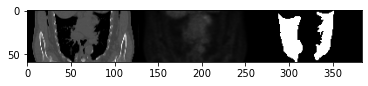


0.0 1.0
0.0 0.860622
LC03414
66 199 267 68
18


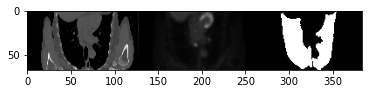

In [ ]:
Path = "D:\\LungCancer\\2020-lung-cancer\\collected_data\\CT"
path2save = "D:\\LungCancer\\src\\dataset\\total_12_folders"
list_wrong_measurement = []
size_desired = 128
n_slc_desired = 96
for dirName, subdirList, fileList in os.walk(Path):
    if (len(fileList) > 1) :
        pathCTdicom = dirName
        pathPETdicom = pathCTdicom.replace("CT_", "").replace("CT", "PET")
        
#         if dirName[-7:] + ".npy" in os.listdir(path2save +"\\CT"):
#             continue
#         if "LC06120" not in dirName:
#             continue
#         if int(dirName[-5:]) < 8615:
#             continue
            
        patient_CT = misc.load_scan(pathCTdicom)
        patient_pixels_CT = misc.get_pixels_hu(patient_CT)
        pix_spc_CT = patient_CT[0].PixelSpacing[0]*patient_pixels_CT.shape[1]/size_desired
        pix_resampled_CT, _ = misc.resample(patient_pixels_CT, 
                                               patient_CT[0].SliceThickness, 
                                               patient_CT[0].PixelSpacing[0], 
                                               patient_CT[0].PixelSpacing[1], 
                                               [pix_spc_CT,pix_spc_CT,pix_spc_CT])
        #print(patient_CT[0])
        
        patient_PET = misc.load_scan(pathPETdicom)
        patient_pixels_PET = misc.get_pixels_hu(patient_PET)
        pix_spc_PT = patient_PET[0].PixelSpacing[0]*patient_pixels_PET.shape[1]/size_desired
#         pix_resampled_PET, _ = misc.resample(patient_pixels_PET, 
#                                                patient_CT[0].SliceThickness, 
#                                                patient_PET[0].PixelSpacing[0], 
#                                                patient_PET[0].PixelSpacing[1], 
#                                                [pix_spc_PT,pix_spc_PT,pix_spc_PT])
        pix_resampled_PET, _ = misc.resample(patient_pixels_PET, 
                                               patient_CT[0].SliceThickness, 
                                               1, 
                                               1, 
                                               [pix_spc_CT,1, 1])
    
        #print(patient_PET[0].pixel_array.min(), patient_PET[0].pixel_array.max())
        if pix_resampled_CT.shape != pix_resampled_PET.shape: #, "Different with shape of 3D slices of  patient {}".format(dirName[-5:])
            list_wrong_measurement.append(dirName[-7:]+"-different shape")
            print(pix_resampled_CT.shape, pix_resampled_PET.shape)
            print(dirName[-7:]+"-different shape")
            continue
            
        idx, y_min, y_max, mask = lung_segment(pix_resampled_CT, pix_spc_CT)
        
        if idx==0 or y_max-y_min > 370/pix_spc_CT:
            print(idx, y_min, y_max)
            list_wrong_measurement.append(dirName[-7:]+"-Can not detect lung")
            print(dirName[-7:]+"-Can not detect lung")
            continue
        
            
        pix_resampled_CT = pix_resampled_CT[y_min: y_max, :, :]
        pix_resampled_PET = pix_resampled_PET[y_min: y_max, :, :]
        mask = mask[y_min: y_max, :,]

        pix_resampled_CT  = pix_resampled_CT.astype(np.float32)
        pix_resampled_CT  = misc.window_normalize_image(pix_resampled_CT, 400, 2000)
        
        pix_resampled_PET = pix_resampled_PET.astype(np.float32)
        
        pix_resampled_PET[pix_resampled_PET < 0 ] = 32767.0 
        pix_resampled_PET = (pix_resampled_PET-0) / (32767 - 0)
        
        print(pix_resampled_CT.min(), pix_resampled_CT.max())
        print(pix_resampled_PET.min(), pix_resampled_PET.max())
        pix_resampled_pad_CT, pix_resampled_pad_PET = misc.padding_image(pix_resampled_CT, pix_resampled_PET, n_slc_desired)
        #print(pix_resampled_CT.shape, pix_resampled_PET.shape)
        
#         np.save(os.path.join(path2save, "CT", dirName[-7:]+ ".npy"), pix_resampled_pad_CT)
#         np.save(os.path.join(path2save, "PET", dirName[-7:]+ ".npy"), pix_resampled_pad_PET) 
        print(dirName[-7:])        
        print(idx, y_min, y_max, y_max-y_min)
        print(len(list_wrong_measurement))
        
        img_CT = pix_resampled_CT*255.
        img_PET = pix_resampled_PET*255.
        #, img_PET.shape[:, idx,:], mask.shape)
        out = np.hstack((img_CT[:, idx,:], img_PET[:, idx,:], mask))
        #out = np.hstack((pix_resampled_CT[20, :,:], pix_resampled_PET[20, :,:]))
        plt.imshow(out, cmap="gray")
        plt.show()
        print()
        
        
        


In [4]:
with open("note.txt", "w") as f:
    for ele in list_wrong_measurement:
        f.write(ele+'\n')
    f.close()

In [5]:
5000/pix_spc_CT**2

327.6803355445777

In [6]:
140/pix_spc_CT

35.840018350089395